# Part 1: Analyze the network

The questions in this part are based on Lecture 5.

* Present an analysis/description of the network of bands/artists using tools from Lecture 5. Imagine that you have been tasked with presenting the important facts about the network to an audience who knows about network science, but doesn't know about this particular network.
   - It's OK to also use basic concepts like degree distributions (even though they're from week 4) in your analysis. That way you can make the analysis a standalone, coherent thing.
   - I would like you to include concepts like centrality and assortativity in your analysis.
   - Use a network backbone in your analysis.
   - In addition to standard distribution plots (e.g. degree distributions, etc), your analysis should also include at least one network visualization (but it doesn't have to display the entire network, you can also visualize a network backbone).
   - **Note**: As I write above, an important part of the exercise consists is *selecting the right elements of the lecture* to create a meaningful analysis. So don't solve this part by going exhaustive and just calculating everything you can think of in one massive analysis. Try to focus on using what you've learned to characterize the network.

## Function imported from `backboning.py` suggested by the teacher

In [1]:
import sys, warnings
import numpy as np
import pandas as pd
import networkx as nx
from collections import defaultdict
from scipy.stats import binom

def read(filename, column_of_interest, triangular_input = False, consider_self_loops = True, undirected = False, drop_zeroes = True, sep = "\t"):
   """Reads a field separated input file into the internal backboning format (a Pandas Dataframe).
   The input file should have three or more columns (default separator: tab).
   The input file must have a one line header with the column names.
   There must be two columns called 'src' and 'trg', indicating the origin and destination of the interaction.
   All other columns must contain integer or floats, indicating the edge weight.
   In case of undirected network, the edges have to be present in both directions with the same weights, or set triangular_input to True.

   Args:
   filename (str): The path to the file containing the edges.
   column_of_interest (str): The column name identifying the weight that will be used for the backboning.

   KWArgs:
   triangular_input (bool): Is the network undirected and are the edges present only in one direction? default: False
   consider_self_loops (bool): Do you want to consider self loops when calculating the backbone? default: True
   undirected (bool): Is the network undirected? default: False
   drop_zeroes (bool): Do you want to keep zero weighted connections in the network? Important: it affects methods based on degree, like disparity_filter. default: False
   sep (char): The field separator of the inout file. default: tab

   Returns:
   The parsed network data, the number of nodes in the network and the number of edges.
   """
   table = pd.read_csv(filename, sep = sep)
   table = table[["src", "trg", column_of_interest]]
   table.rename(columns = {column_of_interest: "nij"}, inplace = True)
   if drop_zeroes:
      table = table[table["nij"] > 0]
   if not consider_self_loops:
      table = table[table["src"] != table["trg"]]
   if triangular_input:
      table2 = table.copy()
      table2["new_src"] = table["trg"]
      table2["new_trg"] = table["src"]
      table2.drop("src", 1, inplace = True)
      table2.drop("trg", 1, inplace = True)
      table2 = table2.rename(columns = {"new_src": "src", "new_trg": "trg"})
      table = pd.concat([table, table2], axis = 0)
      table = table.drop_duplicates(subset = ["src", "trg"])
   original_nodes = len(set(table["src"]) | set(table["trg"]))
   original_edges = table.shape[0]
   if undirected:
      return table, original_nodes, original_edges / 2
   else:
      return table, original_nodes, original_edges

def thresholding(table, threshold):
   """Reads a preprocessed edge table and returns only the edges supassing a significance threshold.

   Args:
   table (pandas.DataFrame): The edge table.
   threshold (float): The minimum significance to include the edge in the backbone.

   Returns:
   The network backbone.
   """
   table = table.copy()
   if "sdev_cij" in table:
      return table[(table["score"] - (threshold * table["sdev_cij"])) > 0][["src", "trg", "nij", "score"]]
   else:
      return table[table["score"] > threshold][["src", "trg", "nij", "score"]]

def write(table, network, method, folder):
   if not table.empty and "src" in table:
      table.to_csv("%s/%s_%s.csv" % (folder, network, method), sep = "\t", index = False)
   else:
      warnings.warn("Incorrect/empty output. Nothing written on disk", RuntimeWarning)

def stability_jac(table1, table2):
   table1_edges = set(zip(table1["src"], table1["trg"]))
   table2_edges = set(zip(table2["src"], table2["trg"]))
   return float(len(table1_edges & table2_edges)) / len(table1_edges | table2_edges)

def stability_corr(table1, table2, method = "spearman", log = False, what = "nij"):
   corr_table = table1.merge(table2, on = ["src", "trg"])
   corr_table = corr_table[["%s_x" % what, "%s_y" % what]]
   if log:
      corr_table["%s_x" % what] = np.log(corr_table["%s_x" % what])
      corr_table["%s_y" % what] = np.log(corr_table["%s_y" % what])
   return corr_table["%s_x" % what].corr(corr_table["%s_y" % what], method = method)

def test_densities(table, start, end, step):
   if start > end:
      raise ValueError("start must be lower than end")
   steps = []
   x = start
   while x <= end:
      steps.append(x)
      x += step
   onodes = len(set(table["src"]) | set(table["trg"]))
   oedges = table.shape[0]
   oavgdeg = (2.0 * oedges) / onodes
   for s in steps:
      edge_table = thresholding(table, s)
      nodes = len(set(edge_table["src"]) | set(edge_table["trg"]))
      edges = edge_table.shape[0]
      avgdeg = (2.0 * edges) / nodes
      yield (s, nodes, (100.0 * nodes) / onodes, edges, (100.0 * edges) / oedges, avgdeg, avgdeg / oavgdeg)

def noise_corrected(table, undirected = False, return_self_loops = False, calculate_p_value = False):
   sys.stderr.write("Calculating NC score...\n")
   table = table.copy()
   src_sum = table.groupby(by = "src").sum()[["nij"]]
   table = table.merge(src_sum, left_on = "src", right_index = True, suffixes = ("", "_src_sum"))
   trg_sum = table.groupby(by = "trg").sum()[["nij"]]
   table = table.merge(trg_sum, left_on = "trg", right_index = True, suffixes = ("", "_trg_sum"))
   table.rename(columns = {"nij_src_sum": "ni.", "nij_trg_sum": "n.j"}, inplace = True)
   table["n.."] = table["nij"].sum()
   table["mean_prior_probability"] = ((table["ni."] * table["n.j"]) / table["n.."]) * (1 / table["n.."])
   if calculate_p_value:
      table["score"] = binom.cdf(table["nij"], table["n.."], table["mean_prior_probability"])
      return table[["src", "trg", "nij", "score"]]
   table["kappa"] = table["n.."] / (table["ni."] * table["n.j"])
   table["score"] = ((table["kappa"] * table["nij"]) - 1) / ((table["kappa"] * table["nij"]) + 1)
   table["var_prior_probability"] = (1 / (table["n.."] ** 2)) * (table["ni."] * table["n.j"] * (table["n.."] - table["ni."]) * (table["n.."] - table["n.j"])) / ((table["n.."] ** 2) * ((table["n.."] - 1)))
   table["alpha_prior"] = (((table["mean_prior_probability"] ** 2) / table["var_prior_probability"]) * (1 - table["mean_prior_probability"])) - table["mean_prior_probability"]
   table["beta_prior"] = (table["mean_prior_probability"] / table["var_prior_probability"]) * (1 - (table["mean_prior_probability"] ** 2)) - (1 - table["mean_prior_probability"])
   table["alpha_post"] = table["alpha_prior"] + table["nij"]
   table["beta_post"] = table["n.."] - table["nij"] + table["beta_prior"]
   table["expected_pij"] = table["alpha_post"] / (table["alpha_post"] + table["beta_post"])
   table["variance_nij"] = table["expected_pij"] * (1 - table["expected_pij"]) * table["n.."]
   table["d"] = (1.0 / (table["ni."] * table["n.j"])) - (table["n.."] * ((table["ni."] + table["n.j"]) / ((table["ni."] * table["n.j"]) ** 2)))
   table["variance_cij"] = table["variance_nij"] * (((2 * (table["kappa"] + (table["nij"] * table["d"]))) / (((table["kappa"] * table["nij"]) + 1) ** 2)) ** 2) 
   table["sdev_cij"] = table["variance_cij"] ** .5
   if not return_self_loops:
      table = table[table["src"] != table["trg"]]
   if undirected:
      table = table[table["src"] <= table["trg"]]
   return table[["src", "trg", "nij", "score", "sdev_cij"]]

def doubly_stochastic(table, undirected = False, return_self_loops = False):
   sys.stderr.write("Calculating DST score...\n")
   table = table.copy()
   table2 = table.copy()
   original_nodes = len(set(table["src"]) | set(table["trg"]))
   table = pd.pivot_table(table, values = "nij", index = "src", columns = "trg", aggfunc = "sum", fill_value = 0) + .001
   row_sums = table.sum(axis = 1)
   attempts = 0
   while np.std(row_sums) > 1e-12:
      table = table.div(row_sums, axis = 0)
      col_sums = table.sum(axis = 0)
      table = table.div(col_sums, axis = 1)
      row_sums = table.sum(axis = 1)
      attempts += 1
      if attempts > 1000:
         warnings.warn("Matrix could not be reduced to doubly stochastic. See Sec. 3 of Sinkhorn 1964", RuntimeWarning)
         return pd.DataFrame()
   table = pd.melt(table.reset_index(), id_vars = "src")
   table = table[table["src"] < table["trg"]]
   table = table[table["value"] > 0].sort_values(by = "value", ascending = False)
   i = 0
   if undirected:
      G = nx.Graph()
      while nx.number_connected_components(G) != 1 or nx.number_of_nodes(G) < original_nodes:
         edge = table.iloc[i]
         G.add_edge(edge["src"], edge["trg"], weight = edge["value"])
         i += 1
   else:
      G = nx.DiGraph()
      while nx.number_weakly_connected_components(G) != 1 or nx.number_of_nodes(G) < original_nodes:
         edge = table.iloc[i]
         G.add_edge(edge["src"], edge["trg"], weight = edge["value"])
         i += 1
   table = pd.melt(nx.to_pandas_adjacency(G).reset_index(), id_vars = "index")
   table = table[table["value"] > 0]
   table.rename(columns = {"index": "src", "variable": "trg", "value": "cij"}, inplace = True)
   table["score"] = table["cij"]
   table = table.merge(table2[["src", "trg", "nij"]], on = ["src", "trg"])
   if not return_self_loops:
      table = table[table["src"] != table["trg"]]
   if undirected:
      table = table[table["src"] <= table["trg"]]
   return table[["src", "trg", "nij", "score"]]

def disparity_filter(table, undirected = False, return_self_loops = False):
   sys.stderr.write("Calculating DF score...\n")
   table = table.copy()
   table_sum = table.groupby(table["src"]).sum().reset_index()
   table_deg = table.groupby(table["src"]).count()["trg"].reset_index()
   table = table.merge(table_sum, on = "src", how = "left", suffixes = ("", "_sum"))
   table = table.merge(table_deg, on = "src", how = "left", suffixes = ("", "_count"))
   table["score"] = 1.0 - ((1.0 - (table["nij"] / table["nij_sum"])) ** (table["trg_count"] - 1))
   table["variance"] = (table["trg_count"] ** 2) * (((20 + (4.0 * table["trg_count"])) / ((table["trg_count"] + 1.0) * (table["trg_count"] + 2) * (table["trg_count"] + 3))) - ((4.0) / ((table["trg_count"] + 1.0) ** 2)))
   if not return_self_loops:
      table = table[table["src"] != table["trg"]]
   if undirected:
      table["edge"] = table.apply(lambda x: "%s-%s" % (min(x["src"], x["trg"]), max(x["src"], x["trg"])), axis = 1)
      table_maxscore = table.groupby(by = "edge")["score"].max().reset_index()
      table_minvar = table.groupby(by = "edge")["variance"].min().reset_index()
      table = table.merge(table_maxscore, on = "edge", suffixes = ("_min", ""))
      table = table.merge(table_minvar, on = "edge", suffixes = ("_max", ""))
      table = table.drop_duplicates(subset = ["edge"])
      table = table.drop(columns="edge")
      table = table.drop(columns="score_min")
      table = table.drop(columns="variance_max")
   return table[["src", "trg", "nij", "score", "variance"]]

def high_salience_skeleton(table, undirected = False, return_self_loops = False):
   sys.stderr.write("Calculating HSS score...\n")
   table = table.copy()
   table["distance"] = 1.0 / table["nij"]
   nodes = set(table["src"]) | set(table["trg"])
   G = nx.from_pandas_edgelist(table, source = "src", target = "trg", edge_attr = "distance", create_using = nx.DiGraph())
   cs = defaultdict(float)
   for s in nodes:
      pred = defaultdict(list)
      dist = {t: float("inf") for t in nodes}
      dist[s] = 0.0
      Q = defaultdict(list)
      for w in dist:
         Q[dist[w]].append(w)
      S = []
      while len(Q) > 0:
         v = Q[min(Q.keys())].pop(0)
         S.append(v)
         for _, w, l in G.edges(nbunch = [v,], data = True):
            new_distance = dist[v] + l["distance"]
            if dist[w] > new_distance:
               Q[dist[w]].remove(w)
               dist[w] = new_distance
               Q[dist[w]].append(w)
               pred[w] = []
            if dist[w] == new_distance:
               pred[w].append(v)
         while len(S) > 0:
            w = S.pop()
            for v in pred[w]:
               cs[(v, w)] += 1.0
         Q = defaultdict(list, {k: v for k, v in Q.items() if len(v) > 0})
   table["score"] = table.apply(lambda x: cs[(x["src"], x["trg"])] / len(nodes), axis = 1)
   if not return_self_loops:
      table = table[table["src"] != table["trg"]]
   if undirected:
      table["edge"] = table.apply(lambda x: "%s-%s" % (min(x["src"], x["trg"]), max(x["src"], x["trg"])), axis = 1)
      table_maxscore = table.groupby(by = "edge")["score"].sum().reset_index()
      table = table.merge(table_maxscore, on = "edge", suffixes = ("_min", ""))
      table = table.drop_duplicates(subset = ["edge"])
      table = table.drop(columns=["edge", "score_min"])
      table["score"] = table["score"] / 2.0
   return table[["src", "trg", "nij", "score"]]

def naive(table, undirected = False, return_self_loops = False):
   sys.stderr.write("Calculating Naive score...\n")
   table = table.copy()
   table["score"] = table["nij"]
   if not return_self_loops:
      table = table[table["src"] != table["trg"]]
   if undirected:
      table["edge"] = table.apply(lambda x: "%s-%s" % (min(x["src"], x["trg"]), max(x["src"], x["trg"])), axis = 1)
      table_maxscore = table.groupby(by = "edge")["score"].sum().reset_index()
      table = table.merge(table_maxscore, on = "edge", suffixes = ("_min", ""))
      table = table.drop_duplicates(subset = ["edge"])
      table = table.drop("edge", 1)
      table = table.drop("score_min", 1)
      table["score"] = table["score"] / 2.0
   return table[["src", "trg", "nij", "score"]]

def maximum_spanning_tree(table, undirected = False):
   sys.stderr.write("Calculating MST score...\n")
   table = table.copy()
   table["distance"] = 1.0 / table["nij"]
   G = nx.from_pandas_edgelist(table, source = "src", target = "trg", edge_attr = ["distance", "nij"])
   T = nx.minimum_spanning_tree(G, weight = "distance")
   table2 = nx.to_pandas_edgelist(T)
   table2 = table2[table2["nij"] > 0]
   table2.rename(columns = {"source": "src", "target": "trg", "nij": "score"}, inplace = True)
   table = table.merge(table2, on = ["src", "trg"])
   if undirected:
      table["edge"] = table.apply(lambda x: "%s-%s" % (min(x["src"], x["trg"]), max(x["src"], x["trg"])), axis = 1)
      table = table.drop_duplicates(subset = ["edge"])
      table = table.drop("edge", 1)
   return table[["src", "trg", "nij", "score"]]


## Answer to Part 1

## 1.1 General analysis about nodes, edges and GCC

**Disclaimer**: Since the question was to "presenting the important facts about the network to an audience who knows about network science, but doesn't know about this particular network.", we started again the presentation, covering also topics already covered last week.

In [2]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

nodes = pd.read_csv("https://raw.githubusercontent.com/lovomanuel/sgi/main/rock_data/nodes.csv")
edges = pd.read_csv("https://raw.githubusercontent.com/lovomanuel/sgi/main/rock_data/edges.csv")

G = nx.DiGraph()

#nodes
for _, row in nodes.iterrows():
    G.add_node(row["id"], content_length=int(row["content_length"]))

#edges
for _, row in edges.iterrows():
    G.add_edge(row["source"], row["target"])

# basic stats
N = G.number_of_nodes()
M = G.number_of_edges()

print("Nodes:", N)
print("Links:", M)

# weakly connected components
wcc = list(nx.weakly_connected_components(G))

# biggest component (GCC)
gcc_nodes = max(wcc, key=len)
G_dir_gcc = G.subgraph(gcc_nodes).copy()
print("Directed GCC:", G_dir_gcc.number_of_nodes(), G_dir_gcc.number_of_edges())

# undirected version 
G_und_gcc = G_dir_gcc.to_undirected()
print("Undirected GCC:", G_und_gcc.number_of_nodes(), G_und_gcc.number_of_edges())


Nodes: 490
Links: 7305
Directed GCC: 490 7305
Undirected GCC: 490 6212


We collected Wikipedia pages about bands and artists, and we connected them when one page links to another. So every node is “a music page”, and every arrow is “this page links to that page”.
The graph is directed because Wikipedia links go in one direction (A links to B, but maybe B doesn’t link back).

After loading nodes/edges, the graph contains 490 nodes and 7305 edges.
We analyze the largest weakly connected component (GCC) to focus on the main graph and avoid tiny components that are not structurally informative. 

## 1.2 In-Degree, Out-Degree, Density and Reciprocity

In [3]:
density = nx.density(G_dir_gcc)

# Reciprocity (fraction of mutual dyads) on the directed GCC
reciprocity = nx.reciprocity(G_dir_gcc)

print(f"Density (directed GCC): {density:.6f}")
print(f"Reciprocity (directed GCC): {reciprocity:.3f}")
# degree dictionaries
in_degs = dict(G.in_degree())
out_degs = dict(G.out_degree())

in_vals = np.array(list(in_degs.values()))
out_vals = np.array(list(out_degs.values()))

print("In-degree: min", in_vals.min(), "max", in_vals.max(), "mean", in_vals.mean())
print("Out-degree: min", out_vals.min(), "max", out_vals.max(), "mean", out_vals.mean())


Density (directed GCC): 0.030487
Reciprocity (directed GCC): 0.299
In-degree: min 0 max 366 mean 14.908163265306122
Out-degree: min 0 max 169 mean 14.908163265306122


After removing isolates and keeping the largest weakly connected component, the directed graph of rock artists contains a density of 0.030, meaning that only about 3% of all possible links are present.
This confirms the network is sparse, as expected for information or association graphs on Wikipedia.

The reciprocity is 0.299, so roughly 30 % of the links are mutual, meaning that, if artist A links to artist B, in about one third of the cases B also links back to A.
This reciprocity says that some connections are bidirectional (typical for bands that share members), but the majority are asymmetric.

The degree numbers show that the network is very uneven.
Some artists have almost no links, while a few have hundreds.
The biggest in-degree is 366 and the biggest out-degree is 169, while the average is only about 15.
This means that only a small number of famous bands are linked by many others, and most artists are connected to just a few.
So the network has a heavy-tailed shape: a few very popular hubs and many small ones.
This is what we usually see in real-world information networks, where popularity and fame are not shared equally.

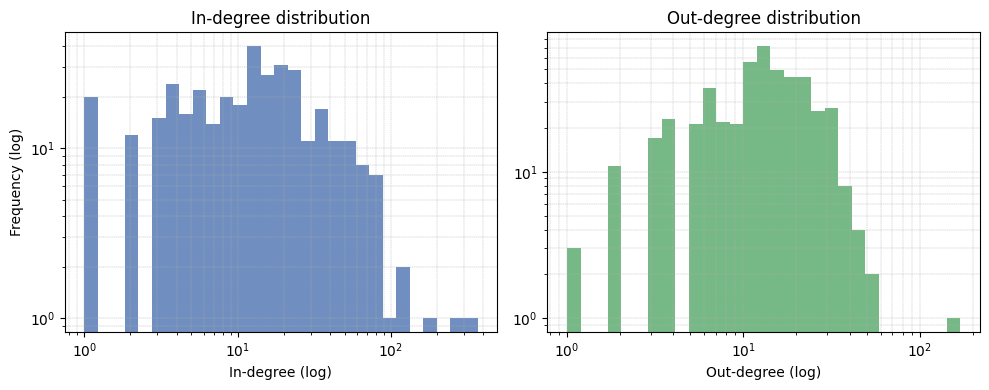

In [4]:
in_deg  = np.array([d for _, d in G.in_degree()])
out_deg = np.array([d for _, d in G.out_degree()])

fig, axes = plt.subplots(1, 2, figsize=(10,4))

# --- In-degree ---
bins_in = np.logspace(np.log10(1), np.log10(max(in_deg)+1), 30)
axes[0].hist(in_deg[in_deg>0], bins=bins_in, color="#4C72B0", alpha=0.8)
axes[0].set_xscale("log")
axes[0].set_yscale("log")
axes[0].set_title("In-degree distribution")
axes[0].set_xlabel("In-degree (log)")
axes[0].set_ylabel("Frequency (log)")
axes[0].grid(True, which="both", ls="--", lw=0.3)

# --- Out-degree ---
bins_out = np.logspace(np.log10(1), np.log10(max(out_deg)+1), 30)
axes[1].hist(out_deg[out_deg>0], bins=bins_out, color="#55A868", alpha=0.8)
axes[1].set_xscale("log")
axes[1].set_yscale("log")
axes[1].set_title("Out-degree distribution")
axes[1].set_xlabel("Out-degree (log)")
axes[1].grid(True, which="both", ls="--", lw=0.3)

plt.tight_layout()
plt.show()



We decided to plot in a log-scale due to heavy-tail that made the graph looks bad in the usual scale.
We can see from the out-degree plot that most nodes have a small number of outgoing links and that there is a long tail (some performer's pages link to a lot). Overall shape looks skewed but not extremely.
For what regards in-degree distribution there is a spike at 0, meaning that many performers are not linked to by others; moreover there is a long heavy tail, meaning that some performers get referenced by a large number of others.

The difference between those two are given by the fact that out-degree is limited by how many links editors choose to add on a single page, while in-degree can grow without bound as many different pages link to the same popular performer.

In [5]:
top_in  = sorted(G.in_degree(),  key=lambda x: x[1], reverse=True)[:5]
top_out = sorted(G.out_degree(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 by IN-degree:")
for n, d in top_in:
    print(f"{n}: {d}")

print("\nTop 5 by OUT-degree:")
for n, d in top_out:
    print(f"{n}: {d}")


Top 5 by IN-degree:
AllMusic: 366
Rock music: 293
The Beatles: 172
The Rolling Stones: 123
Led Zeppelin: 120

Top 5 by OUT-degree:
Rock music: 169
Alice in Chains: 56
Deep Purple: 56
Bryan Adams: 45
Guns N Roses: 44


The performers with the highest in-degree are AllMusic (366), Rock music (293), The Beatles (172), The Rolling Stones (123), and Led Zeppelin (120). This means many other pages link to them, which makes sense: the general pages (AllMusic and Rock music) act like hubs, and the globally famous bands (Beatles, Stones, Zeppelin) are natural reference points.

The performers with the highest out-degree are Rock music (169), Alice in Chains (56), Deep Purple (56), Bryan Adams (45), and Guns N’ Roses (44). These are the pages that link out to many others, often because they contain long lists of influences, collaborations, or band members.

This pattern is what I expected: the most iconic bands attract lots of incoming links. The presence of generic hub pages (AllMusic, Rock music) at the top also highlights that not all “nodes” in the dataset are single bands.

In [6]:
target = "The Beatles"
incoming_neighbors = [n for n in G.predecessors(target)]
print(f"{target} — {len(incoming_neighbors)} incoming links")
print(incoming_neighbors[:15]) 

source = "Deep Purple"
outgoing_neighbors = [n for n in G.successors(source)]
print(f"{source} — {len(outgoing_neighbors)} outgoing links")
print(outgoing_neighbors[:15])


The Beatles — 172 incoming links
['10cc', 'ABBA', 'ACDC', 'Aerosmith', 'Alice Cooper', 'Alice Cooper band', 'Alice in Chains', 'Ambrosia band', 'America band', 'Anthrax American band', 'Arctic Monkeys', 'Avenged Sevenfold', 'Awolnation', 'Badfinger', 'Bay City Rollers']
Deep Purple — 56 outgoing links
['Whitesnake', 'Joe Satriani', 'Rock music', 'Led Zeppelin', 'Black Sabbath', 'Rod Stewart', 'AllMusic', 'The Moody Blues', 'Frank Zappa', 'The Mothers of Invention', 'Bad Company', 'Joe Walsh', 'Bruce Springsteen', 'Ted Nugent', 'Cold Chisel']


The artist, not considering All Rock, with the highest in-degree in my network was The Beatles.
Most of the pages that link to them are bands or musicians who mention The Beatles as an influence, or that include members who played with them.
So the incoming links usually reflect influence or historical importance.
Then, the node with the highest out-degree was Deep Purple.
Their page links to a large number of related bands, former members, and side projects (Rainbow, Whitesnake, Gillan, etc.).


## 1.3 Simple visualizations

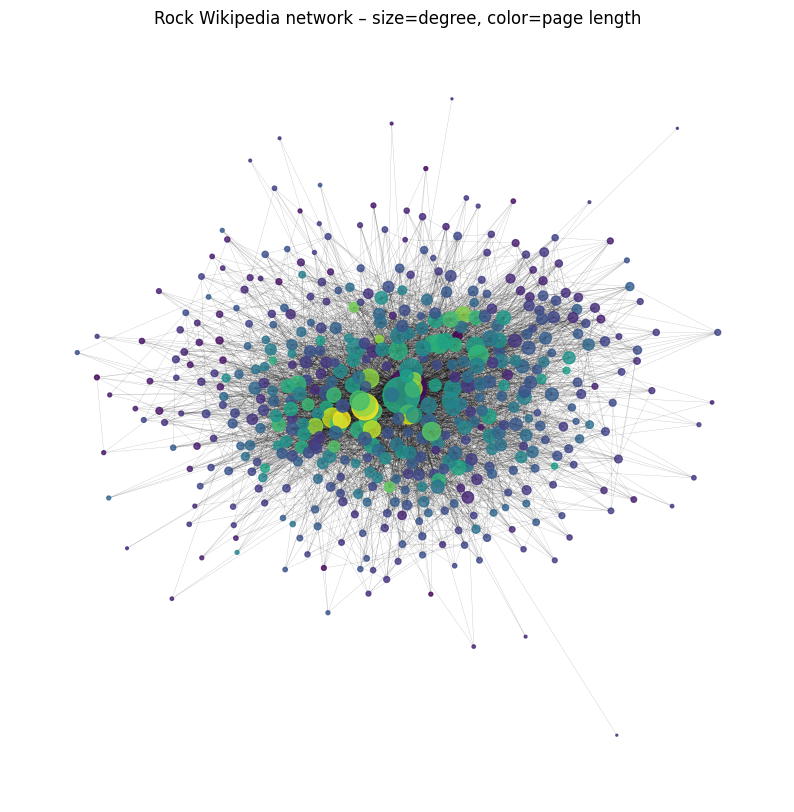

In [7]:
try:
    from networkx.algorithms.approximation import forceatlas2_layout
    HAS_FA2 = True
except ImportError:
    HAS_FA2 = False

G_vis = G_und_gcc

# degree for size
deg_und = dict(G_vis.degree())
sizes = [deg_und[n] * 2 for n in G_vis.nodes()]

# color by content length
content_len = nx.get_node_attributes(G_vis, "content_length")
cl_vals = np.array([content_len.get(n, 0) for n in G_vis.nodes()])
cl_min, cl_max = cl_vals.min(), cl_vals.max()
cl_norm = (cl_vals - cl_min) / (cl_max - cl_min + 1e-9)

if HAS_FA2:
    pos = forceatlas2_layout(G_vis, iterations=200)
else:
    pos = nx.spring_layout(G_vis, k=0.15, iterations=200)

plt.figure(figsize=(10,10))
nx.draw_networkx_nodes(G_vis, pos,
                       node_size=sizes,
                       node_color=cl_norm,
                       cmap="viridis",
                       alpha=0.8)
nx.draw_networkx_edges(G_vis, pos, width=0.2, alpha=0.3)
plt.axis("off")
plt.title("Rock Wikipedia network – size=degree, color=page length")
plt.show()


This picture shows the Wikipedia network of rock bands and artists. Each dot represents a Wikipedia page, and every line between two dots means that one page links to another. The size of each dot depends on how many connections that page has — bigger dots are pages that are linked to many others. The color shows how long the article is: yellow and green dots are long and detailed pages, while purple and blue ones are shorter.

We can see that most nodes gather in one big dense cluster in the middle. This means that many artists and bands are connected, either directly or through a few steps. Around the center, there are a few small groups or isolated dots, which represent pages that are less connected. 


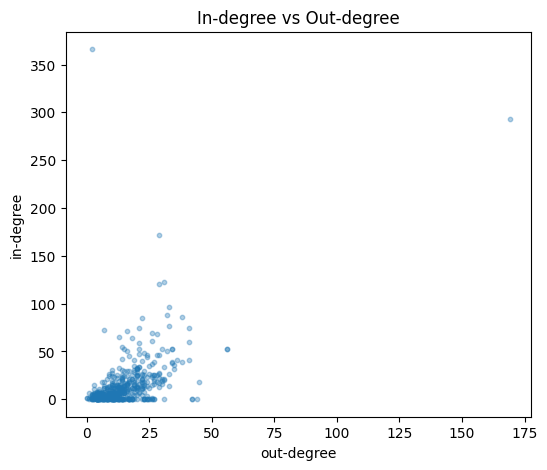

In [8]:
in_vals = np.array([G.in_degree(n) for n in G.nodes()])
out_vals = np.array([G.out_degree(n) for n in G.nodes()])

plt.figure(figsize=(6,5))
plt.scatter(out_vals, in_vals, alpha=0.35, s=10)
plt.xlabel("out-degree")
plt.ylabel("in-degree")
plt.title("In-degree vs Out-degree")
plt.show()


This scatter plot compares how many links each Wikipedia page receives (in-degree) with how many links it creates (out-degree). Each dot is one page, artists or bands.
Most of the dots are concentrated in the bottom-left corner. This means that most pages both link to only a few others and are linked by only a few. So, the majority of the network consists of small or less-connected pages.
However, we can also notice a few dots that are much higher or further to the right. Those points represent pages that are more connected than the average.

Also this chart confirm what we discovered above.

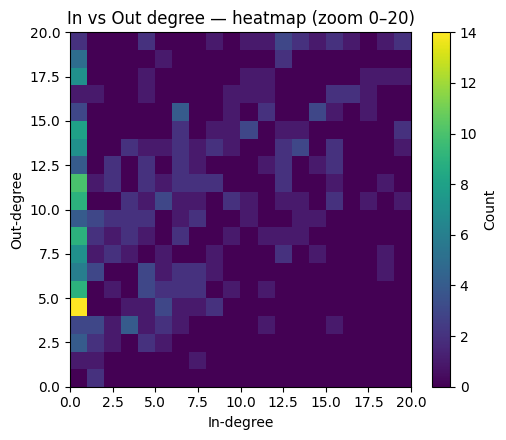

In [9]:
in_d  = np.array([d for _, d in G_dir_gcc.in_degree()], dtype=int)
out_d = np.array([d for _, d in G_dir_gcc.out_degree()], dtype=int)


# Zoom ranges
xmax = 20
ymax = 20

# 2D bins (21 edges -> unit squares)
xbins = np.arange(0, xmax+1, 1)
ybins = np.arange(0, ymax+1, 1)

H, xedges, yedges = np.histogram2d(in_d, out_d, bins=[xbins, ybins])

plt.figure(figsize=(5.2,4.5))
# Transpose because histogram2d returns shape (len(xbins)-1, len(ybins)-1)
plt.imshow(H.T, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           aspect='auto', interpolation='nearest')
cbar = plt.colorbar()
cbar.set_label("Count")
plt.xlabel("In-degree")
plt.ylabel("Out-degree")
plt.title("In vs Out degree — heatmap (zoom 0–20)")
plt.xlim(0, xmax); plt.ylim(0, ymax)
plt.tight_layout()
plt.show()

The heatmap shows how the in-degree and out-degree of each artist relate to each other. Most of the color is concentrated in the lower-left part of the plot, which means that the majority of artists have both very few incoming and outgoing links. These are smaller or less known pages that don’t get mentioned much and also don’t link to many other bands. 

There is also a visible vertical line around low in-degree but higher out-degree values. This happens because some pages, like big bands with many members or side projects, or for example All Rocks, include lots of links to others but are not necessarily linked back by them. These nodes act more like “hubs” that point outward rather than receiving attention.

In general, there is no clear diagonal pattern that would show a strong correlation between in-degree and out-degree. This suggests that being famous (many people linking to you) does not mean that your page links to many others, and vice versa. It also matches what we saw before with a reciprocity of around 0.3: some mutual connections exist, but most links are one-directional.

## 1.4 Correlation with context length

In [10]:
from scipy.stats import pearsonr, spearmanr

contents = np.array([G.nodes[n]["content_length"] for n in G.nodes()])

# Compute correlations
pear_in, p_pear_in = pearsonr(contents, in_deg)
pear_out, p_pear_out = pearsonr(contents, out_deg)
spear_in, p_spear_in = spearmanr(contents, in_deg)
spear_out, p_spear_out = spearmanr(contents, out_deg)

# Pretty print
print("Correlation between page length and degree:\n")
print(f"{'Type':<25}{'In-degree':>15}{'Out-degree':>20}")
print("-" * 60)
print(f"{'Pearson (linear)':<25}{pear_in:>10.3f} (p={p_pear_in:.1e}){pear_out:>10.3f} (p={p_pear_out:.1e})")
print(f"{'Spearman (rank)':<25}{spear_in:>10.3f} (p={p_spear_in:.1e}){spear_out:>10.3f} (p={p_spear_out:.1e})")



Correlation between page length and degree:

Type                           In-degree          Out-degree
------------------------------------------------------------
Pearson (linear)              0.464 (p=1.8e-27)     0.542 (p=1.1e-38)
Spearman (rank)               0.490 (p=5.6e-31)     0.654 (p=4.2e-61)


To understand if longer Wikipedia pages are also more connected, we calculated the correlation between the page length (content_length) and both in-degree and out-degree.

The Pearson correlation tells us how strongly two variables are related in a linear way, while the Spearman correlation measures how well they increase together in general.

The results are shown above and we can see that all the p-values are extremely small (close to 0), which means the correlations are statistically significant, meaning that longer pages tend to have more links. The relationship is better for out-degree, that makes sense: the more text a page has, the more chances it has to mention and link to other artists or bands.

This find make sense with the concept of how the graph is constructed using wikipedia.

## 1.5 Centralities and Assortativity

In [11]:
Gu = G_und_gcc

deg_cent = nx.degree_centrality(Gu)
bet_cent = nx.betweenness_centrality(Gu)
eig_cent = nx.eigenvector_centrality(Gu, max_iter=1000)

def top5(d):
    return sorted(d.items(), key=lambda x: x[1], reverse=True)[:5]

def pretty_top5(title, data):
    print(f"\n {title}")
    print(f"{'Rank':<6}{'Node':<30}{'Score':>10}")
    print("-" * 50)
    for i, (node, val) in enumerate(top5(data), start=1):
        print(f"{i:<6}{node:<30}{val:>10.3f}")

pretty_top5("Top 5 – Degree Centrality", deg_cent)
pretty_top5("Top 5 – Betweenness Centrality", bet_cent)
pretty_top5("Top 5 – Eigenvector Centrality", eig_cent)




 Top 5 – Degree Centrality
Rank  Node                               Score
--------------------------------------------------
1     AllMusic                           0.751
2     Rock music                         0.712
3     The Beatles                        0.358
4     The Rolling Stones                 0.272
5     Led Zeppelin                       0.266

 Top 5 – Betweenness Centrality
Rank  Node                               Score
--------------------------------------------------
1     AllMusic                           0.287
2     Rock music                         0.247
3     The Beatles                        0.042
4     The Rolling Stones                 0.025
5     Led Zeppelin                       0.020

 Top 5 – Eigenvector Centrality
Rank  Node                               Score
--------------------------------------------------
1     AllMusic                           0.288
2     Rock music                         0.281
3     The Beatles                        0.181
4

Here we analyzed centralities, that, in network science, centrality helps us find which nodes are the most important or influential in a network.
Here we computed three main types of centrality for the undirected version of our Wikipedia network: degree, betweenness, and eigenvector centrality.

**Degree centrality** simply counts how many links a node has.
In our case, it measures how many other Wikipedia pages a given page connects to (either directly linking or being linked) and normalized by the total.

The pages with the highest degree centrality are: AllMusic, Rock music, The Beatles, The Rolling Stones, Led Zeppelin and these are exactly the pages we found above when ordered by degree.

**Betweenness centrality** tells us how often a node lies on the shortest paths between other nodes.
A node with high betweenness is a sort of bridge or connector between different parts of the network.

Here, the same two pages (AllMusic and Rock music) have the highest betweenness values, meaning they are not only popular but also connect different sub-communities of the network.
For example, AllMusic might link together pages from different rock subgenres or different decades.
So these nodes help keep the whole network connected, removing them would mean that many smaller parts could become isolated.

**Eigenvector centrality** measures influence more indirectly: a node is important if it connects to other important nodes.
So it rewards not just the number of links, but who those links are connected to.

The ranking is again led by AllMusic and Rock music, followed by The Beatles, The Rolling Stones, and Led Zeppelin.

In [12]:
# degree assortativity (undirected)
deg_assort = nx.degree_assortativity_coefficient(Gu)
print("Degree assortativity:", deg_assort)

# attribute (content_length) assortativity
nx.set_node_attributes(Gu, {n: Gu.nodes[n].get("content_length", 0) for n in Gu.nodes()},
                       "content_length")
attr_assort = nx.attribute_assortativity_coefficient(Gu, "content_length")
print("Content-length assortativity:", attr_assort)


Degree assortativity: -0.14702914219734753
Content-length assortativity: -0.004688448165848452


Remembering that **assortativity** measures when nodes in a network tend to connect to similar nodes or to different ones, if high-degree nodes (very connected pages) usually link to other high-degree nodes, the network is assortative (positive value), if high-degree nodes tend to connect to low-degree nodes, the network is disassortative (negative value) and if instead there’s no clear pattern, the value is close to zero (neutral).

The degree assortativity is about -0.15, which is a little bit negative meaning that highly connected pages tend to link to pages that have low number of connections.
So, instead of big artist/band linking to other big artist/band, the network has a different structure: a few central pages connected to many smaller ones, confirming what we said before

The **content-length assortativity** is very close to zero, meaning that the length of a page doesn’t really influence whether it connects to other long or short pages.

## 1.6 Backbones

Before goin on, it is important to understand a concept. When a network is very large, like ours, it becomes hard to read or analyze. Almost every node is connected to many others, creating a big cloud of edges where it’s impossible to see which parts are actually important.

We often extract what is called a **network backbone**, that is a simplified version of the graph that keeps only the most significant or structurally relevant edges, and removes the weaker or redundant ones.
One of the most classic method is the Disparity Filter, where for every node, we check how its total connection “strength” is distributed in its edges.
The Disparity Filter uses a small statistical test for each edge to decide this.
An edge is kept if its weight is unlikely to appear by random chance under a null model.

However, Disparity Filter only works on weighted networks, because it depends on the relative strength of each edge compared to the node’s total strength. So we first had to create weights that reflect the importance of each edge.

To apply the backbone idea to our network, we will build three weighted versions:
- The undirected version of the rock music network, where each edge’s weight is proportional to its edge betweenness centrality, rescaled between 1 and 100.
- The same network, but edge weights are inverted (1 / betweenness)
- A High Salience Skeleton

Then we will apply the Disparity Filter using α = 0.05, removing edges that are not statistically significant, leaving only the ones that carry most weight.

It is important to say that the code following part has been written by the help of LLMs, as suggested in Week5. It has been used for fixing functions of the file **backboning.py** taken from the link shared in Week5 and adapt the code for then using and create visualization of the backboning.

Calculating HSS score...
Calculating DF score...
Calculating DF score...
Calculating DF score...


W1 (weighted): nodes=490, edges=6212, components=1, kept=100.00%
W1 backbone (Disparity top 10%): nodes=490, edges=622, components=93, kept=10.01%
W2 (weighted inverse): nodes=490, edges=6212, components=1, kept=100.00%
W2 backbone (Disparity top 10%): nodes=490, edges=622, components=91, kept=10.01%
W3 (HSS weighted by salience): nodes=490, edges=6212, components=1, kept=100.00%
W3 backbone (HSS→Disparity top 10%): nodes=490, edges=622, components=198, kept=10.01%


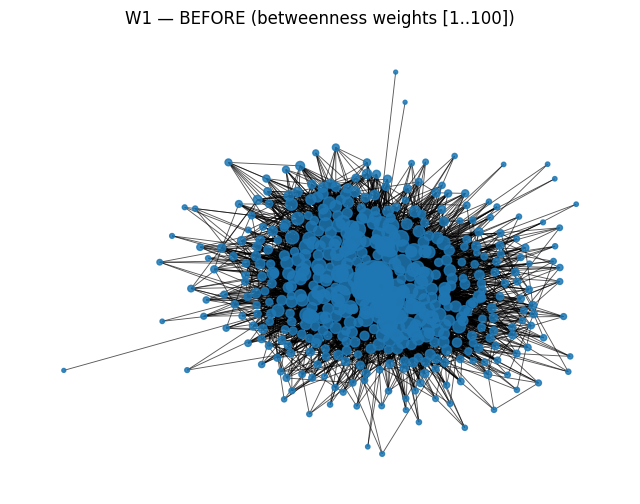

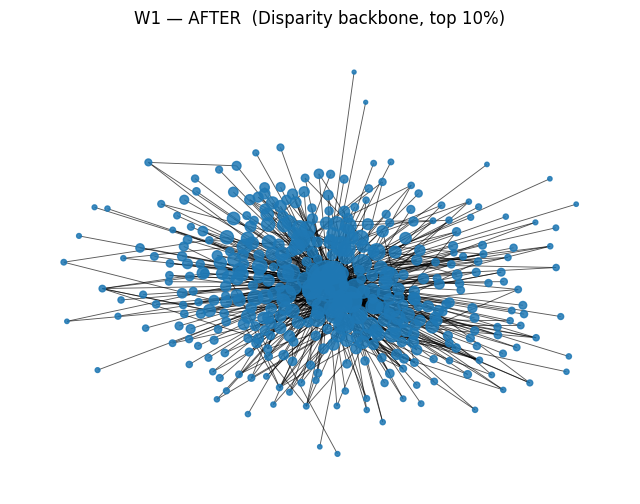

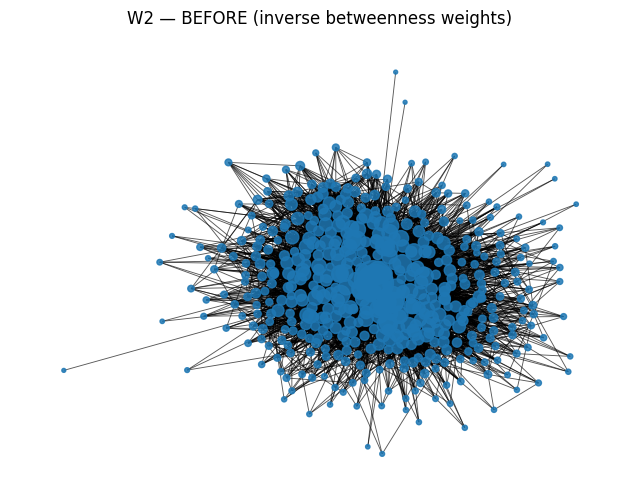

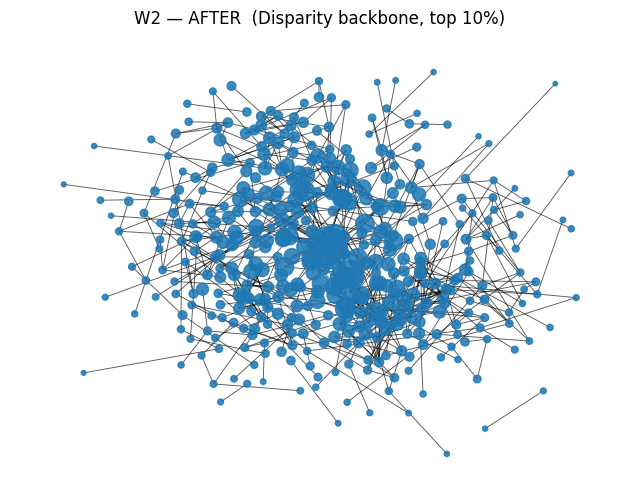

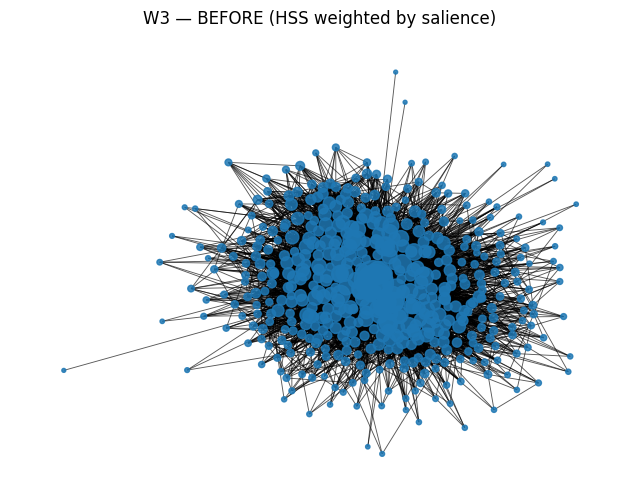

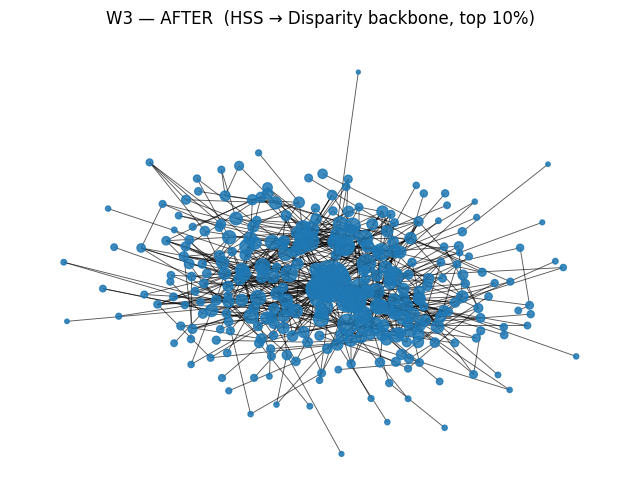

In [13]:
Gu = G_und_gcc  

# ---------------------------------------------------------------------
# 1) Weighted Network 1 — edge betweenness weights in [1, 100]
# ---------------------------------------------------------------------
edge_bw_raw = nx.edge_betweenness_centrality(Gu)  
# enforce sorted keys (u<v) for safe lookup
edge_bw = {tuple(sorted(k)): v for k, v in edge_bw_raw.items()}

bw_vals = np.array(list(edge_bw.values()), dtype=float)
bw_min, bw_max = float(bw_vals.min()), float(bw_vals.max())
den = (bw_max - bw_min) if (bw_max > bw_min) else 1.0

def norm_1_100(x: float) -> float:
    return 1.0 + 99.0 * (x - bw_min) / den

G_w1 = nx.Graph()
G_w1.add_nodes_from(Gu.nodes(data=True))
for u, v in Gu.edges():
    w = norm_1_100(edge_bw[tuple(sorted((u, v)))])
    G_w1.add_edge(u, v, weight=w)

# ---------------------------------------------------------------------
# 2) Weighted Network 2 — inverse of W1 weights
# ---------------------------------------------------------------------
G_w2 = nx.Graph()
G_w2.add_nodes_from(Gu.nodes(data=True))
for u, v, d in G_w1.edges(data=True):
    w1 = float(d["weight"])
    G_w2.add_edge(u, v, weight=(1.0 / w1) if w1 > 0 else 0.0)

# ---------------------------------------------------------------------
# 3) Weighted Network 3 — High-Salience Skeleton (HSS) from backboning.py
#     HSS expects a table with columns: src, trg, nij (edge weight). We use nij=1.0.
# ---------------------------------------------------------------------

edges_tbl_unw = pd.DataFrame([(u, v, 1.0) for u, v in Gu.edges()],
                             columns=["src", "trg", "nij"])
hss_df = high_salience_skeleton(edges_tbl_unw, undirected=True)  # returns src, trg, nij, score

G_w3 = nx.Graph()
G_w3.add_nodes_from(Gu.nodes(data=True))
for r in hss_df.itertuples(index=False):
    G_w3.add_edge(r.src, r.trg, weight=float(r.score))  # weight = salience

# ---------------------------------------------------------------------
# 4) Disparity Filter backbones for each weighted network
#     (Using backboning.py disparity_filter on tables)
# ---------------------------------------------------------------------

def table_from_graph(Gw: nx.Graph, weight_col="weight") -> pd.DataFrame:
    return pd.DataFrame([(u, v, float(d.get(weight_col, 1.0)))
                         for u, v, d in Gw.edges(data=True)],
                        columns=["src", "trg", "nij"])

#tables for functions
edges_tbl_w1 = table_from_graph(G_w1, weight_col="weight")
edges_tbl_w2 = table_from_graph(G_w2, weight_col="weight")
edges_tbl_w3 = table_from_graph(G_w3, weight_col="weight")  # salience as nij

# Disparity score tables (undirected)
df_disp_w1 = disparity_filter(edges_tbl_w1, undirected=True)  # columns: src,trg,nij,score
df_disp_w2 = disparity_filter(edges_tbl_w2, undirected=True)
df_disp_w3 = disparity_filter(edges_tbl_w3, undirected=True)

def keep_top_fraction(df: pd.DataFrame, frac=0.10, score_col="score") -> pd.DataFrame:
    if df.empty:
        return df.copy()
    thr = np.quantile(df[score_col], 1 - frac)
    return df[df[score_col] >= thr].copy()

W1_df_bb = keep_top_fraction(df_disp_w1, frac=0.10, score_col="score")  # top 10% strongest
W2_df_bb = keep_top_fraction(df_disp_w2, frac=0.10, score_col="score")
W3_df_bb = keep_top_fraction(df_disp_w3, frac=0.10, score_col="score")  # disparity-pruned HSS

def df_to_graph(df: pd.DataFrame, base_graph: nx.Graph) -> nx.Graph:
    H = nx.Graph()
    H.add_nodes_from(base_graph.nodes(data=True))
    for r in df.itertuples(index=False):
        # keep both the original nij and the disparity score
        H.add_edge(r.src, r.trg, nij=float(r.nij), score=float(r.score))
    return H

G_w1_bb = df_to_graph(W1_df_bb, Gu)
G_w2_bb = df_to_graph(W2_df_bb, Gu)
G_w3_bb = df_to_graph(W3_df_bb, Gu)


def gstats(G: nx.Graph, base: nx.Graph, name: str):
    n = G.number_of_nodes()
    e = G.number_of_edges()
    comps = nx.number_connected_components(G)
    kept = e / base.number_of_edges() if base.number_of_edges() else 0.0
    print(f"{name}: nodes={n}, edges={e}, components={comps}, kept={kept:.2%}")

gstats(G_w1, Gu, "W1 (weighted)")
gstats(G_w1_bb, Gu, "W1 backbone (Disparity top 10%)")
gstats(G_w2, Gu, "W2 (weighted inverse)")
gstats(G_w2_bb, Gu, "W2 backbone (Disparity top 10%)")
gstats(G_w3, Gu, "W3 (HSS weighted by salience)")
gstats(G_w3_bb, Gu, "W3 backbone (HSS→Disparity top 10%)")

# Build a shared layout on the union of all before/after graphs
G_union = nx.Graph()
G_union.add_nodes_from(Gu.nodes(data=True))
for Gx in (G_w1, G_w1_bb, G_w2, G_w2_bb, G_w3, G_w3_bb):
    G_union.add_edges_from(Gx.edges())

pos_shared = nx.spring_layout(
    G_union,
    k=1/np.sqrt(max(1, G_union.number_of_nodes())),
    iterations=300,
    seed=42
)

def drop_isolates(G: nx.Graph) -> nx.Graph:
    H = G.copy()
    H.remove_nodes_from(list(nx.isolates(H)))
    return H

def draw_graph(G: nx.Graph, title: str, base_graph: nx.Graph, pos=pos_shared):
    if G.number_of_edges() == 0:
        print(f"{title}: empty"); return
    H = drop_isolates(G)
    sizes = [6 + 2*base_graph.degree(n) for n in H.nodes()]
    plt.figure(figsize=(8,6))
    nx.draw_networkx_nodes(H, pos, node_size=sizes, alpha=0.85)
    nx.draw_networkx_edges(H, pos, width=0.65, alpha=0.65)
    plt.title(title); plt.axis("off"); plt.show()

# W1
draw_graph(G_w1,    "W1 — BEFORE (betweenness weights [1..100])", Gu)
draw_graph(G_w1_bb, "W1 — AFTER  (Disparity backbone, top 10%)",   Gu)

# W2
draw_graph(G_w2,    "W2 — BEFORE (inverse betweenness weights)",   Gu)
draw_graph(G_w2_bb, "W2 — AFTER  (Disparity backbone, top 10%)",   Gu)

# W3
draw_graph(G_w3,    "W3 — BEFORE (HSS weighted by salience)",      Gu)
draw_graph(G_w3_bb, "W3 — AFTER  (HSS → Disparity backbone, top 10%)", Gu)



After applying the Disparity Filter, all three networks are much sparser, but they keep the most meaningful relationships. Even if they all retain around ten percent of the original edges, the way these connections are arranged tells us different things.

- In W1, **the betweenness-weighted backbone looks very centralized**. Most nodes point in a dense core, while many smaller nodes remain ""outside"" with only one or two connections. This says that a few influential artists or bands act as global bridges linking different parts of the rock ecosystem. These confirm what we though about historically important big names that many others mention. 

- In W2, where the **weights are inverted**, the network appears more balanced and less dominated by one big hub. Clusters of nodes are more visible and they are more locally connected to each other rather than to one central core. 

- W3, which comes from **the High-Salience Skeleton** followed by the Disparity Filter, has a structure that looks smaller and cleaner, but keeps a strong core. 
This means that the algorithm has kept the edges that are most essential for maintaining global connectivity, the routes that appear most often across shortest paths. It feels like the minimal skeleton of the network.

## 1.7 Conclusions

We started from a big directed network of artists and bands linking to each other and explored it step by step. The first thing we looked at was the degree distribution, which showed that only a few artists have many links, while most have very few. This means the network is very unbalanced, like many real-world systems where some nodes become much more visible or important than others. The density and reciprocity also confirmed that most connections go only one way—usually one page mentioning another without being mentioned back.

When we checked centrality, we saw that some artists act as bridges connecting different parts of the network. High in-degree nodes are often the famous or influential ones, while high out-degree nodes are usually pages that reference many others. The visualizations showed a big dense center and smaller groups around it, which probably match different rock genres or time periods.

With the backbone extraction, the main structure became clearer. Using betweenness, inverse betweenness, and high-salience skeletons, we could keep only the strongest or most meaningful connections. Even if the methods were different, they all showed the same general picture: rock music has a few key hubs linking many smaller, tight communities.

# Part 2: Genres and communities and plotting 

The questions below are based on Lecture 7, part 2.

## 2.1 Write about genres and modularity

**Modularity** basically measures how well a network is divided into communities compared to what we’d expect if the connections were random.
In our case, we treat **genres** as communities, so we’re checking whether artists that share the same genre are more connected to each other than they would be by chance.

The formula from the book (Eq. 9.12) is:

$$
M = \sum_{c=1}^{n_c} \left[\frac{L_c}{L} - \left(\frac{k_c}{2L}\right)^2\right]
$$

* $L$ is the total number of edges in the network.
* $L_c$ is the number of edges *inside* community $c$.
* $k_c$ is the sum of the degrees of all nodes in that community.

The first term $\frac{L_c}{L}$ tells us how many of the network’s links actually stay inside the community,
while the second term $\left(\frac{k_c}{2L}\right)^2$ represents how many we would expect if links were placed at random.
So, if a community has more internal connections than expected, it contributes positively to the modularity.

A modularity value close to **1** would mean there are strong, well-separated communities,
while values around **0** suggest that the partition (in this case, by genre) doesn’t really capture the network’s structure.

From the output below, we can see there are 314 artists in total, and each artist is part of about 3/4 genres on average. This means many artists play different kinds of music. Even if there are 334 genres in total, most artists belong to just a few popular ones. From the chart below, we can see that *alternative rock*, *hard rock*, and *pop rock* are the most common, while the other genres have a lot fewer artists.

Number of nodes with genres: 314
Average number of genres per node: 3.53
Total number of distinct genres: 167


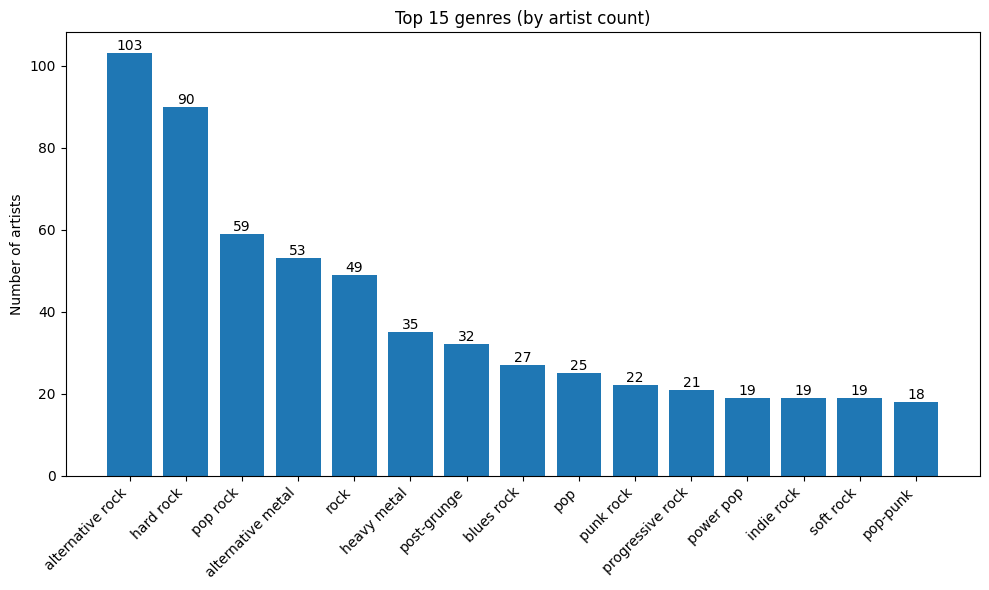

In [14]:
# === Load precomputed genres from GitHub (no parsing), report stats, and plot top-15 ===
import io
import json
import requests
from pathlib import Path
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

BASE_URL = "https://raw.githubusercontent.com/lorenzocazzador/socialgraphs-data/refs/heads/main/rock_performers_wikitext"

def load_text_from_github(path: str) -> str:
    url = f"{BASE_URL}/{path}"
    r = requests.get(url)
    r.raise_for_status()
    return r.text

# ---------------- Load precomputed mapping: artist -> genres ----------------
artist_genres_text = load_text_from_github("artist_genres.json")
artist_to_genres: dict[str, list[str]] = json.loads(artist_genres_text)

# ---------------- Report stats ----------------
num_with_genres = len(artist_to_genres)
avg_genres_per_node = (
    sum(len(v) for v in artist_to_genres.values()) / num_with_genres if num_with_genres else 0.0
)
distinct_genres = sorted({g for glist in artist_to_genres.values() for g in glist})

print(f"Number of nodes with genres: {num_with_genres}")
print(f"Average number of genres per node: {avg_genres_per_node:.2f}")
print(f"Total number of distinct genres: {len(distinct_genres)}")

# ---------------- Top-15 genre histogram ----------------
genre_counts = Counter(g for glist in artist_to_genres.values() for g in glist)
top15 = genre_counts.most_common(15)

labels = [g for g, _ in top15]
counts = [c for _, c in top15]

plt.figure(figsize=(10, 6))
ax = plt.gca()
bars = ax.bar(range(len(labels)), counts)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha="right")
ax.set_ylabel("Number of artists")
ax.set_title("Top 15 genres (by artist count)")
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2.0, height, str(counts[i]),
            ha="center", va="bottom")
plt.tight_layout()
plt.show()

## 2.2 Detect the communities, discuss the value of modularity in comparison to the genres.

We ran Louvain on the artist network and it found 8 communities. The modularity is 0.336, which is a moderate value, not super high, but still showing that there’s some real structure in the network. It means that artists tend to be more connected inside their own communities than with artists from other groups, but the separation isn’t perfect.

When we use genres as communities (like the first genre of each artist), the modularity is much lower (around ~0.10). So the structure-based communities are more meaningful than the genre-based ones. This makes sense because many artists belong to several genres, so using just one genre mixes things and breaks the clusters. Louvain, instead, groups artists based on how they actually connect in the network.


In [15]:
# === Community detection and visualization (data loaded from GitHub) ===
import json
import io
import requests
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import colormaps
from pathlib import Path
from networkx.algorithms.community import louvain_communities
from networkx.algorithms.community.quality import modularity
from infomap import Infomap
from matplotlib.patches import Patch
from fa2 import ForceAtlas2

# -------------------- GitHub base path --------------------
BASE_URL = "https://raw.githubusercontent.com/lorenzocazzador/socialgraphs-data/main/rock_performers_wikitext"

def load_csv_from_github(filename: str) -> pd.DataFrame:
    """Load a CSV file directly from GitHub raw URL."""
    url = f"{BASE_URL}/{filename}"
    r = requests.get(url)
    r.raise_for_status()
    return pd.read_csv(io.StringIO(r.text))

def load_json_from_github(filename: str) -> dict:
    """Load a JSON file directly from GitHub raw URL."""
    url = f"{BASE_URL}/{filename}"
    r = requests.get(url)
    r.raise_for_status()
    return json.loads(r.text)

# -------------------- Load data --------------------
print("🔹 Loading data from GitHub...")
nodes_df = load_csv_from_github("rock_performers_nodes.csv")
edges_df = load_csv_from_github("rock_performers_edges.csv")
artist_to_genres = load_json_from_github("artist_genres.json")

# -------------------- Build the graph --------------------
G_dir = nx.DiGraph()
for _, row in nodes_df.iterrows():
    attrs = row.to_dict()
    title = attrs.pop("title")
    G_dir.add_node(title, **attrs)

for _, row in edges_df.iterrows():
    G_dir.add_edge(row["source"], row["target"])

# Undirected version for community detection
G = G_dir.to_undirected()

# -------------------- Restrict to genre-known nodes --------------------
genre_nodes = [n for n in G.nodes if n in artist_to_genres and artist_to_genres[n]]
Gg = G.subgraph(genre_nodes).copy()
print(f"🎵 Genre-known subgraph: {Gg.number_of_nodes()} nodes, {Gg.number_of_edges()} edges")

# -------------------- Louvain communities --------------------
louvain_communities_list = louvain_communities(Gg, seed=42)
M_louvain = modularity(Gg, louvain_communities_list)
print(f"🧩 Louvain modularity: {M_louvain:.4f}")
print(f"🔸 Found {len(louvain_communities_list)} communities")

# -------------------- Compare with genre partition modularity --------------------
genre_part = {}
for n in Gg.nodes:
    g_list = artist_to_genres.get(n, [])
    if g_list:
        genre_part.setdefault(g_list[0], set()).add(n)
M_genre_first = modularity(Gg, list(genre_part.values()))
print(f"🎶 Genre (first-genre) modularity: {M_genre_first:.4f}")


🔹 Loading data from GitHub...
🎵 Genre-known subgraph: 314 nodes, 3205 edges
🧩 Louvain modularity: 0.3360
🔸 Found 8 communities
🎶 Genre (first-genre) modularity: 0.0967


## 2.3 Calculate the matrix $D$ and discuss your findings.

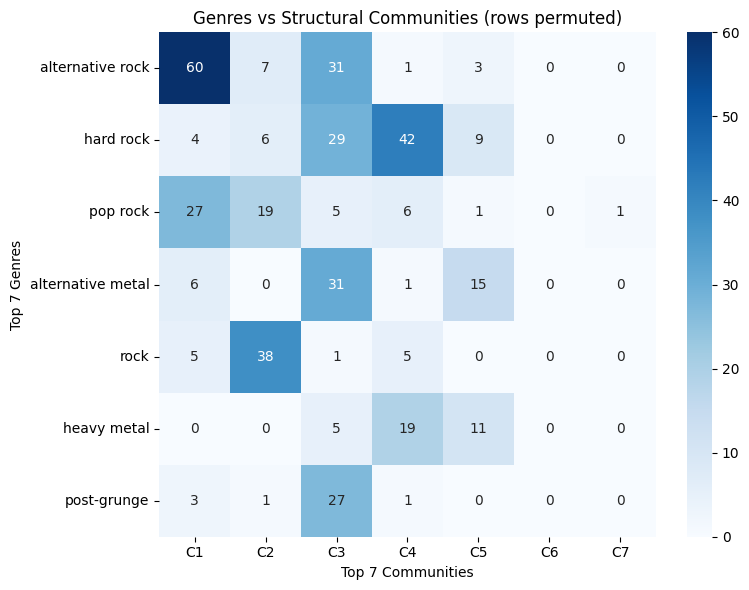

In [16]:
# === Compare communities vs genres (short & clean) ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Requires: Gg (graph), louvain_communities_list (list[set]), artist_to_genres (dict[str, list[str]])

# --- Top 7 genres & communities ---
top_genres = [g for g, _ in Counter(g for gl in artist_to_genres.values() for g in gl).most_common(7)]
comm_sizes = [len(c) for c in louvain_communities_list]
top_c_idx = np.argsort(comm_sizes)[::-1][:7]

# Fast lookups
genre_idx = {g: i for i, g in enumerate(top_genres)}
comm_col = {cid: j for j, cid in enumerate(top_c_idx)}
node2comm = {n: cid for cid, members in enumerate(louvain_communities_list) for n in members}

# --- Confusion matrix D (G × C) ---
D = np.zeros((len(top_genres), len(top_c_idx)), dtype=int)
for n in Gg.nodes:
    cid = node2comm.get(n)
    if cid not in comm_col:
        continue
    j = comm_col[cid]
    for g in artist_to_genres.get(n, []):
        i = genre_idx.get(g)
        if i is not None:
            D[i, j] += 1

# --- Greedy row reorder to look more diagonal ---
# remaining = set(range(D.shape[0]))
# row_order = []
# for j in range(D.shape[1]):
#     if not remaining: break
#     r = max(remaining, key=lambda i: D[i, j])
#     row_order.append(r); remaining.remove(r)
# row_order += sorted(remaining)

# --- Plot ---
D_df = pd.DataFrame(D, index=top_genres, columns=[f"C{j+1}" for j in range(D.shape[1])])
# D_df = D_df.iloc[row_order]

plt.figure(figsize=(8, 6))
sns.heatmap(D_df, annot=True, fmt="d", cmap="Blues")
plt.title("Genres vs Structural Communities (rows permuted)")
plt.xlabel("Top 7 Communities"); plt.ylabel("Top 7 Genres")
plt.tight_layout(); plt.show()

The matrix shows how the top 7 music genres are spread across the 7 biggest Louvain communities. Each number tells how many artists belong to both a certain genre and a certain community.

From the matrix, we can see that some genres like alternative rock, hard rock, and alternative metal have a lot of artists in just one or two communities. This means that the Louvain communities match quite well with these genres. For example, most alternative rock artists are in community C1, while hard rock artists are mostly in C4.

Other genres like pop rock and post-grunge are more spread out, which means those artists are mixed across different communities. This shows that these genres are less tightly connected and overlap more with others.

Overall, the matrix shows that there is a clear but not perfect connection between the genres and the structural communities. The network structure groups artists in a way that often follows their musical style, but not always exactly.


## 2.4 Plot the communities and comment on your results

100%|██████████| 500/500 [00:01<00:00, 447.05it/s]


BarnesHut Approximation  took  0.51  seconds
Repulsion forces  took  0.50  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.02  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


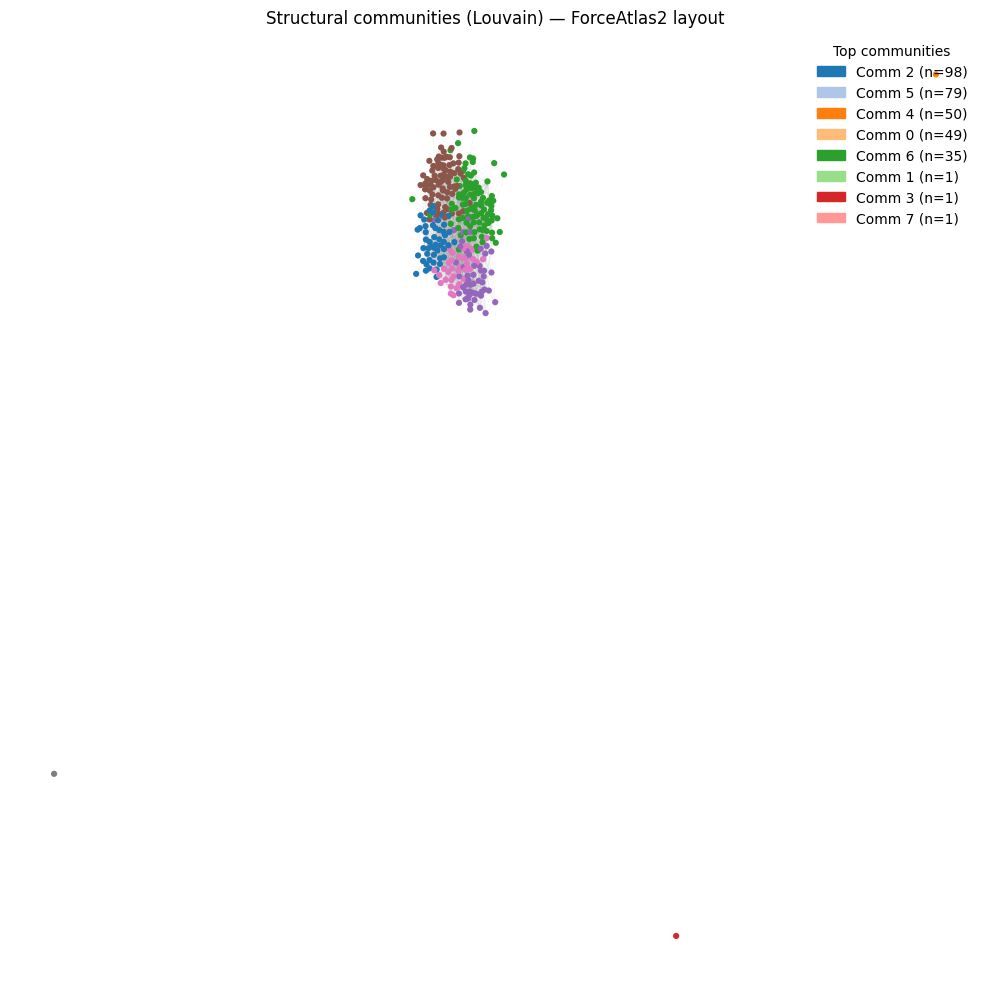

🕸️ Backbone keeps 321 edges (~top 10%)


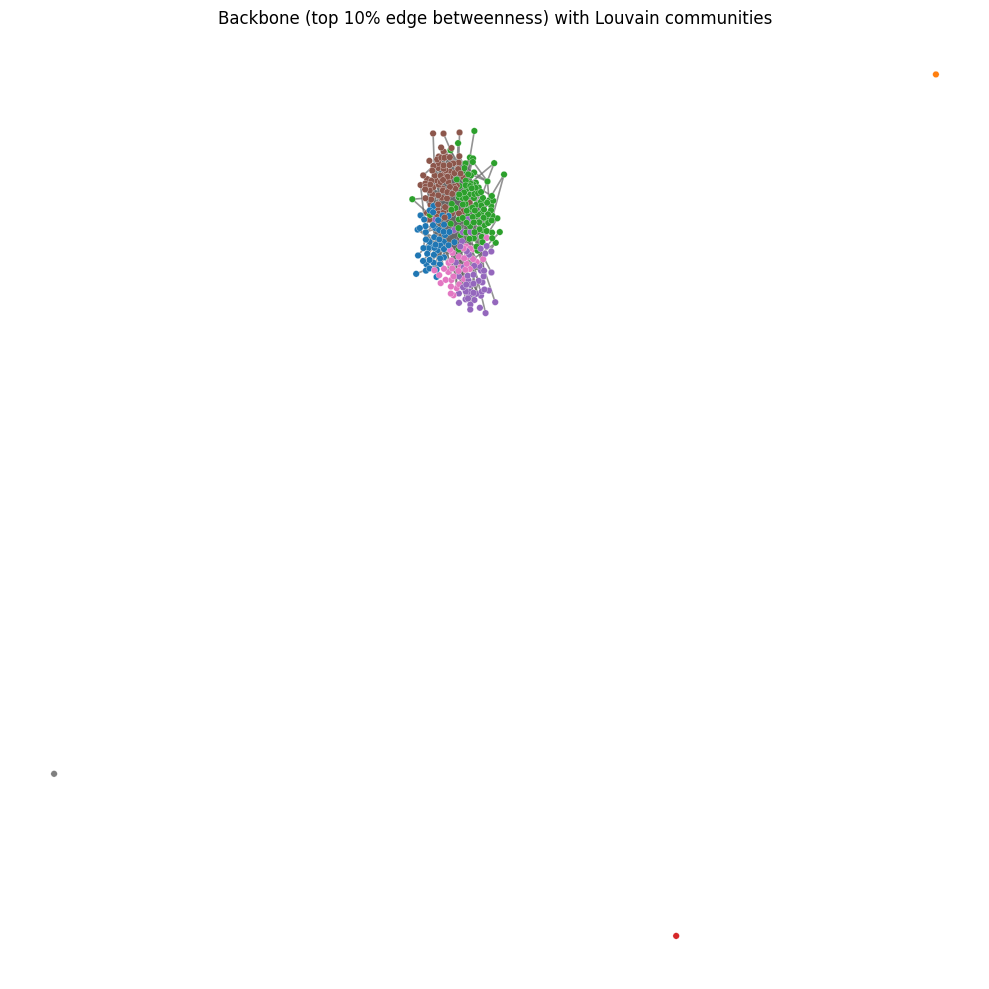

After removing singletons: 311 nodes, 3205 edges


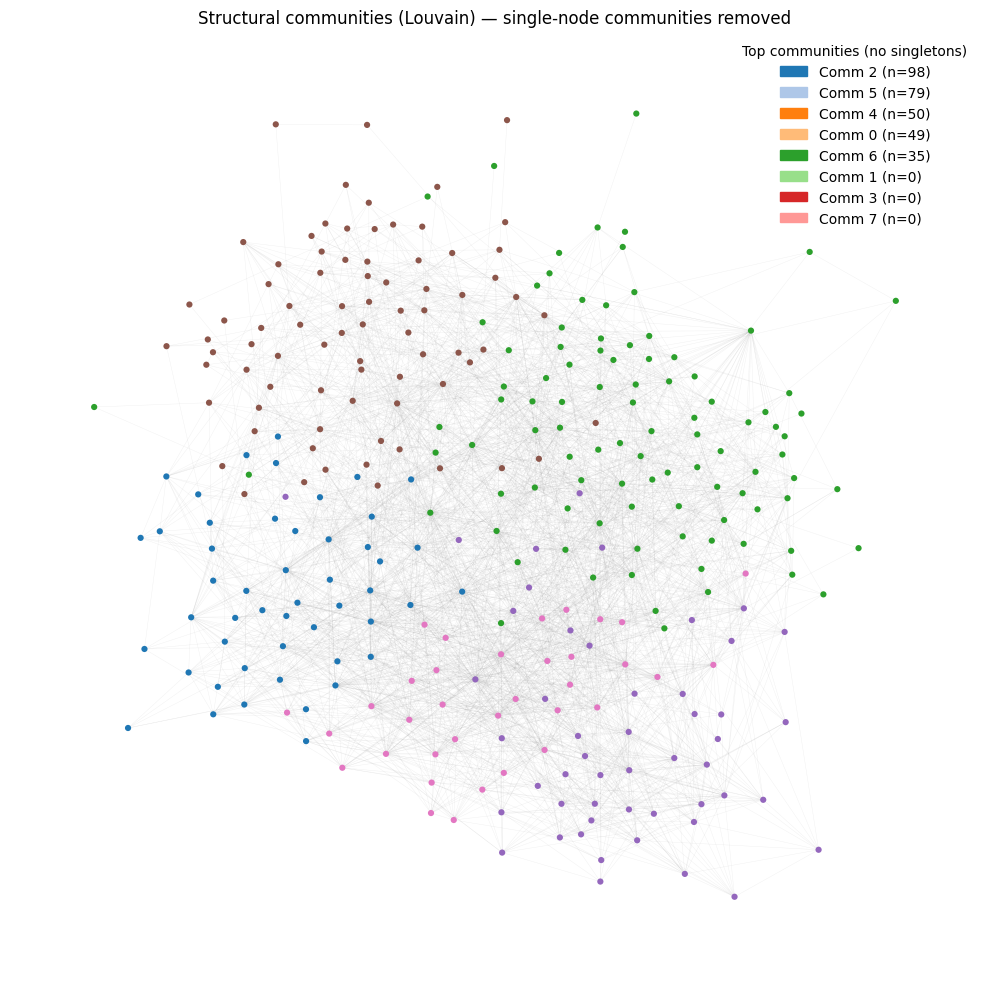

Backbone (no singletons) keeps 321 edges (~top 10%)


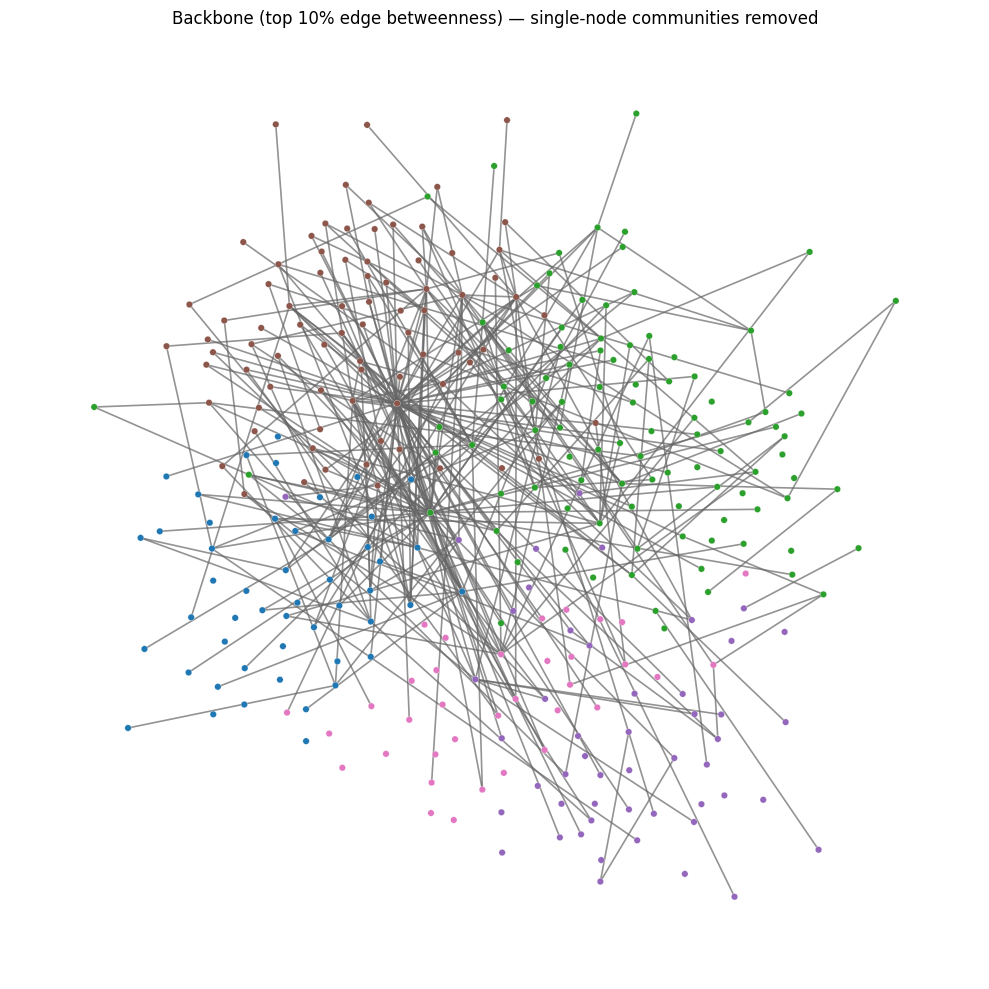

In [31]:
# Node -> community ID map
comm_list = [set(c) for c in louvain_communities_list]
comm_sizes = [len(c) for c in comm_list]
node2comm = {n: cid for cid, members in enumerate(comm_list) for n in members}

# -------------------- ForceAtlas2 layout --------------------
# Patch for NetworkX 3.x
if not hasattr(nx, 'to_scipy_sparse_matrix'):
    nx.to_scipy_sparse_matrix = nx.to_scipy_sparse_array

forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=False,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    jitterTolerance=1.0,
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    scalingRatio=2.0,
    strongGravityMode=False,
    gravity=1.0
)
pos = forceatlas2.forceatlas2_networkx_layout(Gg, iterations=500)

# -------------------- Color top-K communities --------------------
K = 10
top_idx = np.argsort(comm_sizes)[::-1][:K]
top_cids = set(int(i) for i in top_idx)
cmap = colormaps.get_cmap("tab20")
node_colors = [
    cmap(list(top_cids).index(node2comm[n]) / K) if node2comm[n] in top_cids
    else (0.85, 0.85, 0.85, 0.8)
    for n in Gg.nodes
]

# -------------------- Plot full graph --------------------
plt.figure(figsize=(10, 10))
nx.draw_networkx_edges(Gg, pos, width=0.3, alpha=0.15, edge_color="#999999")
nx.draw_networkx_nodes(Gg, pos, node_size=20, node_color=node_colors, linewidths=0)
sorted_top = sorted([(cid, comm_sizes[cid]) for cid in top_cids], key=lambda x: x[1], reverse=True)
plt.legend(
    handles=[Patch(color=cmap(i), label=f"Comm {cid} (n={size})") for i, (cid, size) in enumerate(sorted_top)],
    title="Top communities", loc="upper right", frameon=False
)
plt.axis("off")
plt.title("Structural communities (Louvain) — ForceAtlas2 layout")
plt.tight_layout()
plt.show()

# -------------------- Simple backbone (top 10% edge betweenness) --------------------
p = 0.10
eb = nx.edge_betweenness_centrality(Gg)
thr = np.quantile(list(eb.values()), 1 - p)
backbone_edges = [e for e, val in eb.items() if val >= thr]

Bb = nx.Graph()
Bb.add_nodes_from(Gg.nodes(data=True))
Bb.add_edges_from(backbone_edges)
print(f"🕸️ Backbone keeps {Bb.number_of_edges()} edges (~top {int(p*100)}%)")

plt.figure(figsize=(10, 10))
nx.draw_networkx_edges(Bb, pos, width=1.2, alpha=0.7, edge_color="#666666")
nx.draw_networkx_nodes(Bb, pos, node_size=22, node_color=node_colors, linewidths=0.2, edgecolors="white")
plt.axis("off")
plt.title("Backbone (top 10% edge betweenness) with Louvain communities")
plt.tight_layout()
plt.show()

# === Remove single-node communities and plot again ===

# 1) Find singleton community IDs and drop their nodes
singleton_cids = {cid for cid, sz in enumerate(comm_sizes) if sz == 1}
nodes_to_drop = [n for n, cid in node2comm.items() if cid in singleton_cids]

Gg_no_single = Gg.copy()
Gg_no_single.remove_nodes_from(nodes_to_drop)
print(f"After removing singletons: {Gg_no_single.number_of_nodes()} nodes, {Gg_no_single.number_of_edges()} edges")

# Reuse existing ForceAtlas2 positions for remaining nodes
pos2 = {n: pos[n] for n in Gg_no_single.nodes}

# 2) Recompute sizes restricted to remaining nodes (same Louvain labels)
comm_sizes2 = [len(set_c & set(Gg_no_single.nodes)) for set_c in comm_list]

# Color only top-K among the remaining communities
top_idx2 = np.argsort(comm_sizes2)[::-1][:K]
top_cids2 = set(int(i) for i in top_idx2)

node_colors2 = [
    cmap(list(top_cids2).index(node2comm[n]) / K) if node2comm[n] in top_cids2
    else (0.85, 0.85, 0.85, 0.8)
    for n in Gg_no_single.nodes
]

# 3) Plot graph without singleton communities
plt.figure(figsize=(10, 10))
nx.draw_networkx_edges(Gg_no_single, pos2, width=0.3, alpha=0.15, edge_color="#999999")
nx.draw_networkx_nodes(Gg_no_single, pos2, node_size=20, node_color=node_colors2, linewidths=0)

sorted_top2 = sorted([(cid, comm_sizes2[cid]) for cid in top_cids2], key=lambda x: x[1], reverse=True)
plt.legend(
    handles=[Patch(color=cmap(i), label=f"Comm {cid} (n={size})") for i, (cid, size) in enumerate(sorted_top2)],
    title="Top communities (no singletons)", loc="upper right", frameon=False
)
plt.axis("off")
plt.title("Structural communities (Louvain) — single-node communities removed")
plt.tight_layout()
plt.show()

# 4) Backbone again on the filtered graph
p = 0.10
eb2 = nx.edge_betweenness_centrality(Gg_no_single)
thr2 = np.quantile(list(eb2.values()), 1 - p)
backbone_edges2 = [e for e, val in eb2.items() if val >= thr2]

Bb2 = nx.Graph()
Bb2.add_nodes_from(Gg_no_single.nodes(data=True))
Bb2.add_edges_from(backbone_edges2)
print(f"Backbone (no singletons) keeps {Bb2.number_of_edges()} edges (~top {int(p*100)}%)")

plt.figure(figsize=(10, 10))
nx.draw_networkx_edges(Bb2, pos2, width=1.2, alpha=0.7, edge_color="#666666")
nx.draw_networkx_nodes(Bb2, pos2, node_size=22, node_color=node_colors2, linewidths=0.2, edgecolors="white")
plt.axis("off")
plt.title("Backbone (top 10% edge betweenness) — single-node communities removed")
plt.tight_layout()
plt.show()


The first two graphs show the full network of artists colored by their Louvain communities. Most of the artists are grouped together in the center, while a few single points are far away. These far points are single-node communities that do not really connect to others.

After removing those single-node communities, the third graph looks much clearer. Now there are five main groups that stand out, each shown in a different color. These groups represent artists that are more strongly connected to each other.

The last graph shows the backbone, where only the strongest 10 percent of the connections are kept. The network is more sparse here, but we can still see how some communities remain well connected in the middle, while others are more on the sides. This helps to focus on the most important links between the biggest artist groups.


# Part 3: TF-IDF to understand genres and communities 

The questions below are based on Lecture 7, part 2, 4, 5, 6 (and a little bit on part 3).

## 3.1 Explain the concept of TF-IDF in your own words and how it can help you understand the genres and communities.

TF-IDF is a way to find which words are the most important in a group of texts. TF means term frequency and tells how often a word appears in a text. IDF means inverse document frequency and gives more value to words that appear in fewer texts. When we multiply them, we get a score that shows which words are special for each text.

In this project TF-IDF helps to find which words best describe each genre or community. For example, if a word appears a lot in artists from one genre but not in others, it will get a high TF-IDF score. This makes it easier to understand what makes each group unique and what kind of topics or styles are most common in their songs or descriptions.


## 3.2 Calculate and visualize TF-IDF for the genres and communities.

### 3.2.1 TF-IDF for the genres

Loaded 15 TF files from GitHub.
Top 15 genres: ['alternative rock', 'rock', 'hard rock', 'heavy metal', 'alternative metal', 'pop rock', 'progressive rock', 'pop', 'punk rock', 'blues rock', 'pop-punk', 'post-grunge', 'indie rock', 'soft rock', 'power pop']


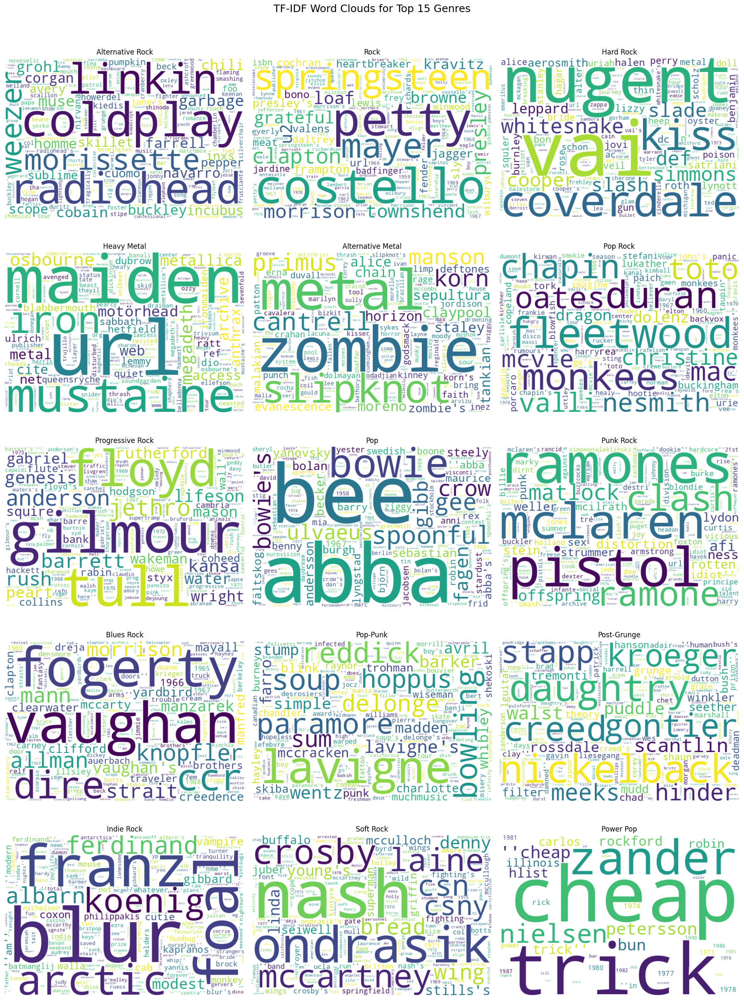

In [18]:
# TF–IDF wordclouds for the top-15 genres (load TF files from GitHub and show in one grid)

import math
import requests
from collections import Counter, defaultdict
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# -------- Load TF lists from GitHub --------
OWNER   = "lorenzocazzador"
REPO    = "socialgraphs-data"
SUBPATH = "rock_performers_wikitext/tf_lists"

api_url = f"https://api.github.com/repos/{OWNER}/{REPO}/contents/{SUBPATH}"
resp = requests.get(api_url, timeout=30)
resp.raise_for_status()
entries = resp.json()

genre_tf: dict[str, Counter] = {}
for e in entries:
    name = e.get("name", "")
    if not name.startswith("tf_") or not name.endswith(".txt"):
        continue
    genre = name.removeprefix("tf_").removesuffix(".txt").replace("_", " ")
    raw_url = e.get("download_url")
    if not raw_url:
        continue

    r = requests.get(raw_url, timeout=30)
    r.raise_for_status()

    c = Counter()
    for line in r.text.splitlines():
        parts = line.strip().split()
        if len(parts) != 2:
            continue
        w, cnt = parts
        try:
            c[w] = int(cnt)
        except ValueError:
            pass
    if c:
        genre_tf[genre] = c

# Pick top-15 genres by total token count
top_genres = sorted(genre_tf.keys(),
                    key=lambda g: sum(genre_tf[g].values()),
                    reverse=True)[:15]

print(f"Loaded {len(genre_tf)} TF files from GitHub.")
print("Top 15 genres:", top_genres)

# -------- Build DF and IDF --------
N = len(top_genres)
df = defaultdict(int)
for g in top_genres:
    for w in genre_tf[g].keys():
        df[w] += 1
idf = {w: math.log(N / df[w]) for w in df}

# -------- Compute TF-IDF and build wordclouds --------
wordclouds = []
titles = []

for g in top_genres:
    tf = genre_tf[g]
    tfidf = {w: tf[w] * idf.get(w, 0.0) for w in tf}
    if not tfidf:
        continue

    # Commented out to reduce output
    # top10 = sorted(tfidf.items(), key=lambda x: x[1], reverse=True)[:10]
    # print(f"\n=== {g} — top 10 TF-IDF words ===")
    # for w, score in top10:
    #     print(f"{w:20s} {score:.3f}")

    maxv = max(tfidf.values())
    scaled = {w: v / maxv for w, v in tfidf.items()} if maxv > 0 else tfidf

    wc = WordCloud(
        width=600,
        height=400,
        background_color="white",
        max_words=200,
        colormap="viridis",
        collocations=False,
        stopwords=set(),
    ).generate_from_frequencies(scaled)

    wordclouds.append(wc)
    titles.append(g.title())

# -------- Plot all wordclouds in one grid (3 columns) --------
cols = 3
rows = math.ceil(len(wordclouds) / cols)
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))

for i, ax in enumerate(axes.flat):
    if i < len(wordclouds):
        ax.imshow(wordclouds[i], interpolation="bilinear")
        ax.axis("off")
        ax.set_title(titles[i])
    else:
        ax.axis("off")

plt.suptitle("TF-IDF Word Clouds for Top 15 Genres", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


The TF-IDF results show the most important artists for each genre. A word gets a high value when it appears often in one genre but not in others. This helps to see what makes each genre special.

From the wordclouds, it is easy to see clear differences between genres. For example, alternative rock is full of modern bands, while heavy metal and hard rock include names linked to louder and more aggressive styles. Pop and soft rock have smoother artists, and punk rock shows more rebellious ones.

Each wordcloud has its own look and focus, meaning TF-IDF captures well the essence of every genre. There is very little overlap between them, so the method works well to highlight what makes each musical community unique.

### 3.2.2 TF-IDF for the communities

Using all 8 communities


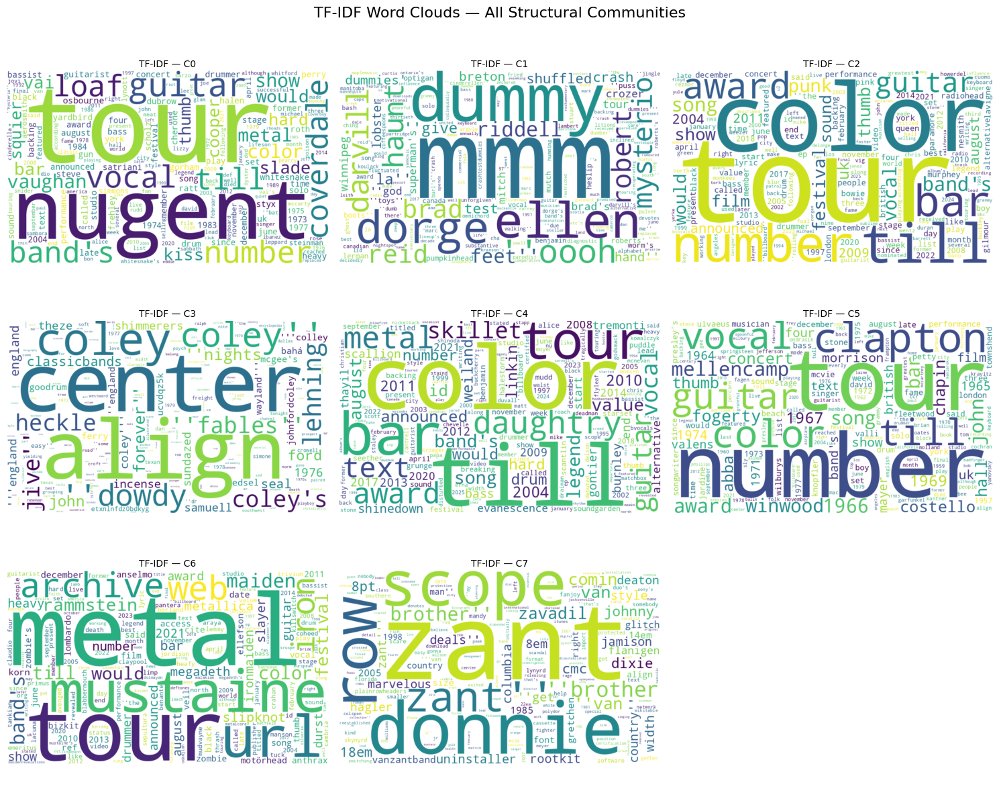

In [19]:
# === Community TF-IDF wordclouds (All structural communities) ===
# Loads pre-cleaned artist texts directly from GitHub, builds one document per community,
# computes TF-IDF across all communities, and plots all wordclouds in a single 3-column grid.

import math
import requests
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
from wordcloud import WordCloud

# ---------------------------------------------------------------------
# Prereqs assumed already in memory:
# - Gg (undirected subgraph)
# - louvain_communities_list (list[set] of artist titles)
# ---------------------------------------------------------------------

RAW_BASE = "https://raw.githubusercontent.com/lorenzocazzador/socialgraphs-data/main/rock_performers_wikitext/cleaned_texts"

def cleaned_filename(title: str) -> str:
    """Make the artist filename used in cleaned_texts/ on GitHub."""
    return title.replace("/", "_").replace(" ", "_") + ".txt"

def fetch_clean_tokens(title: str) -> list[str]:
    """Download pre-cleaned token string for an artist and split to tokens."""
    url = f"{RAW_BASE}/{cleaned_filename(title)}"
    try:
        r = requests.get(url, timeout=10)
        if r.status_code == 200 and r.text.strip():
            return r.text.strip().split()
    except Exception:
        pass
    return []

# ---------------- Use all communities ----------------
num_comms = len(louvain_communities_list)
print(f"Using all {num_comms} communities")

comm_names = [f"C{i}" for i in range(num_comms)]
comm_docs_tokens = []

for members in louvain_communities_list:
    toks = []
    for node in members:
        toks.extend(fetch_clean_tokens(node))
    comm_docs_tokens.append(toks)

# ---------------- TF, DF, and IDF ----------------
comm_tf = [Counter(toks) for toks in comm_docs_tokens]
N = len(comm_tf)
df = defaultdict(int)
for tf in comm_tf:
    for w in tf:
        df[w] += 1
idf = {w: math.log(N / df[w]) for w in df}

# ---------------- Compute TF-IDF and normalize ----------------
tfidf_per_comm = []
for tf in comm_tf:
    tfidf = {w: tf[w] * idf[w] for w in tf if w in idf}
    if tfidf:
        m = max(tfidf.values())
        tfidf = {w: v / m for w, v in tfidf.items()}
    tfidf_per_comm.append(tfidf)

    # Print top 10 words per community (commented out to reduce output)
    # top10 = sorted(tfidf.items(), key=lambda x: x[1], reverse=True)[:10]
    # print(f"\n=== Community top 10 TF-IDF words ===")
    # for w, score in top10:
    #     print(f"{w:20s} {score:.3f}")

# ---------------- Plot all wordclouds in a 3-column grid ----------------
n_cols = 3
n_rows = int(np.ceil(num_comms / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, (name, freqs) in enumerate(zip(comm_names, tfidf_per_comm)):
    ax = axes[i]
    ax.axis("off")
    ax.set_title(f"TF-IDF — {name}", fontsize=10, pad=4)
    if not freqs:
        ax.text(0.5, 0.5, "no text", ha="center", va="center")
        continue
    wc = WordCloud(
        width=900, height=540, background_color="white",
        max_words=200, colormap="viridis", collocations=False
    ).generate_from_frequencies(freqs)
    ax.imshow(wc, interpolation="bilinear")

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.suptitle("TF-IDF Word Clouds — All Structural Communities", fontsize=16, y=0.995)
plt.tight_layout()
plt.show()


The community wordclouds do not seem to reflect any clear musical meaning. Most of the biggest words, like tour, color, and number, are very generic and not really connected to specific music genres or artists. Instead of showing terms that describe a particular style or group of musicians, they mostly include common words that could appear in almost any text.

This suggests that the communities identified in the network are not based on musical similarity but rather on structural connections between artists. The TF-IDF words in these clouds do not reveal any strong theme or pattern that could help interpret what the communities represent. In short, the community wordclouds look not very meaningful, showing that the detected communities do not carry clear information about genres or artistic style. The only exception is community C6, which includes words like metal, mustaine, and maiden, suggesting that it might represent a group of metal bands.


## 3.3 Use the matrix $D$ (Lecture 7, part 2) to dicusss the difference between the word-clouds between genres and communities.

The matrix D shows how the genres are distributed across the different communities. If the genres and the communities matched well, the matrix would have a clear diagonal pattern, with each genre strongly linked to one community. In our case, the matrix is more scattered, meaning that most genres are spread across several communities instead of being concentrated in just one.

Because of this, the wordclouds for the genres and the communities look very different. The genre wordclouds are focused and meaningful, showing artists and words that clearly represent each music style, like Coldplay or Iron Maiden. The community wordclouds instead look much less specific, with many common or unrelated words like tour, color, or number.

This difference happens because the communities were detected only from the structure of the network, not from the genre information. Since the matrix D shows little overlap between genres and communities, it makes sense that the community wordclouds do not reflect the same musical patterns that appear in the genre wordclouds.


# Part 4: Sentiment of the artists and communities

The questions below are based on Lecture 8

## 4.1 Calculate the sentiment of the band/artist pages (it is OK to work with the sub-network of artists-with-genre) and describe your findings using stats and visualization, inspired by the first exercise of week 8.

In [20]:
import os
import re
import csv
from glob import glob
from statistics import mean
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import StringIO

In [21]:
def get_labmt_csv():
    """
    Download the LabMT dataset from the repository and return the raw content
    """
    url = f"https://raw.githubusercontent.com/lorenzocazzador/socialgraphs-data/refs/heads/main/labmt.csv"
    r = requests.get(url, timeout=10)
    if r.status_code == 200 and r.text.strip():
        return r.text

In [22]:
TOKEN_RE = re.compile(r"\b[\w']+\b", flags=re.UNICODE)

def tokenize(text: str):
    return [t.lower() for t in TOKEN_RE.findall(text)]

def load_labmt_from_sent_csv():
    """
    Loads a dict {word: happiness_score} from a CSV with headers:
      'Word', 'Happiness Score' (case-insensitive).
    """
    lex = {}
    content = get_labmt_csv()
    f = StringIO(content)
    
    reader = csv.DictReader(f)
    # Make a case-insensitive header map
    header_map = {h.lower().strip(): h for h in (reader.fieldnames or [])}
    word_col = header_map.get("word")
    score_col = header_map.get("happiness score")
    if not word_col or not score_col:
        raise ValueError("CSV must include 'Word' and 'Happiness Score' columns.")
    for row in reader:
        w = (row.get(word_col) or "").strip().lower()
        s = row.get(score_col)
        if not w or s is None or s == "":
            continue
        try:
            lex[w] = float(s)
        except ValueError:
            continue
    if not lex:
        raise ValueError("No valid word/score pairs parsed from sent.csv.")
    return lex

In [23]:
def sentiment_for_tokens(tokens, lexicon):
    scores = [lexicon[t] for t in tokens if t in lexicon]
    if not scores:
        return None, 0
    return sum(scores) / len(scores), len(scores)

def filename_to_artist(path: str) -> str:
    """Derive an artist/band name from a filename (without extension)."""
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    # Replace underscores/dashes with spaces and title-case
    return re.sub(r"[_\-]+", " ", name).strip()

In [24]:
lex = load_labmt_from_sent_csv()
print(f"Loaded LabMT entries: {len(lex):,}")

Loaded LabMT entries: 10,222


In [25]:
import json

MANIFEST_URL = "https://raw.githubusercontent.com/lorenzocazzador/socialgraphs-data/refs/heads/main/rock_performers_wikitext/manifest.json"
TEXT_URL_BASE = "https://github.com/lorenzocazzador/socialgraphs-data/blob/main/rock_performers_wikitext/cleaned_texts/"

r = requests.get(MANIFEST_URL, timeout=10)
if r.status_code != 200 or not r.text.strip():
    raise Exception("Can't get manifest")

parsed_manifest = json.loads(r.text)

for artist in parsed_manifest:
    url = TEXT_URL_BASE + artist['file'].removeprefix('rock_performers_wikitext/raw_pages/')
    text_req = requests.get(url)
    if r.status_code != 200 or not r.text.strip():
        raise Exception(f"Can't get manifest for {artist['title']}")
    artist['cleaned_text'] = text_req.text

In [26]:
# 3) Compute per-document sentiment
sentiments = []
total_matched = 0
total_tokens = 0

for artist in parsed_manifest:
    text = artist['cleaned_text']
    tokens = tokenize(text)
    avg, matched = sentiment_for_tokens(tokens, lex)
    total_matched += matched
    total_tokens += len(tokens)
    if avg is not None:
        sentiments.append(avg)

# 4) Mean sentiment across all pages (macro-average)
mean_sentiment = mean(sentiments) if sentiments else None

print("\n----- Results -----")
print(f"Documents processed: {len(parsed_manifest)}")
print(f"Mean sentiment across pages (macro-average): {mean_sentiment}")
print(f"Matched lexicon tokens: {total_matched:,} / {total_tokens:,} total tokens")


----- Results -----
Documents processed: 488
Mean sentiment across pages (macro-average): 5.59312275105429
Matched lexicon tokens: 6,562,412 / 20,146,669 total tokens



----- Summary Statistics (per-page sentiments) -----
Documents with sentiment: 488 / 488
Mean:     5.5931
Median:   5.5895
Variance: 0.000636
25th pct: 5.5749
75th pct: 5.6059
Matched lexicon tokens: 6,562,412 / 20,146,669 total tokens

----- Top 10 Happiest Pages -----
The Beach Boys                       5.6990  (matched 19412)
Paul McCartney                       5.6888  (matched 19450)
Queen (band)                         5.6847  (matched 18044)
Iron Maiden                          5.6774  (matched 22336)
Coldplay                             5.6750  (matched 16628)
ABBA                                 5.6744  (matched 17015)
The Beatles                          5.6737  (matched 19067)
Bob Dylan                            5.6659  (matched 18397)
Neil Young                           5.6644  (matched 17032)
Kiss (band)                          5.6643  (matched 17143)

----- Top 10 Saddest Pages -----
Gary Glitter                         5.5468  (matched 13253)
Audioslave             

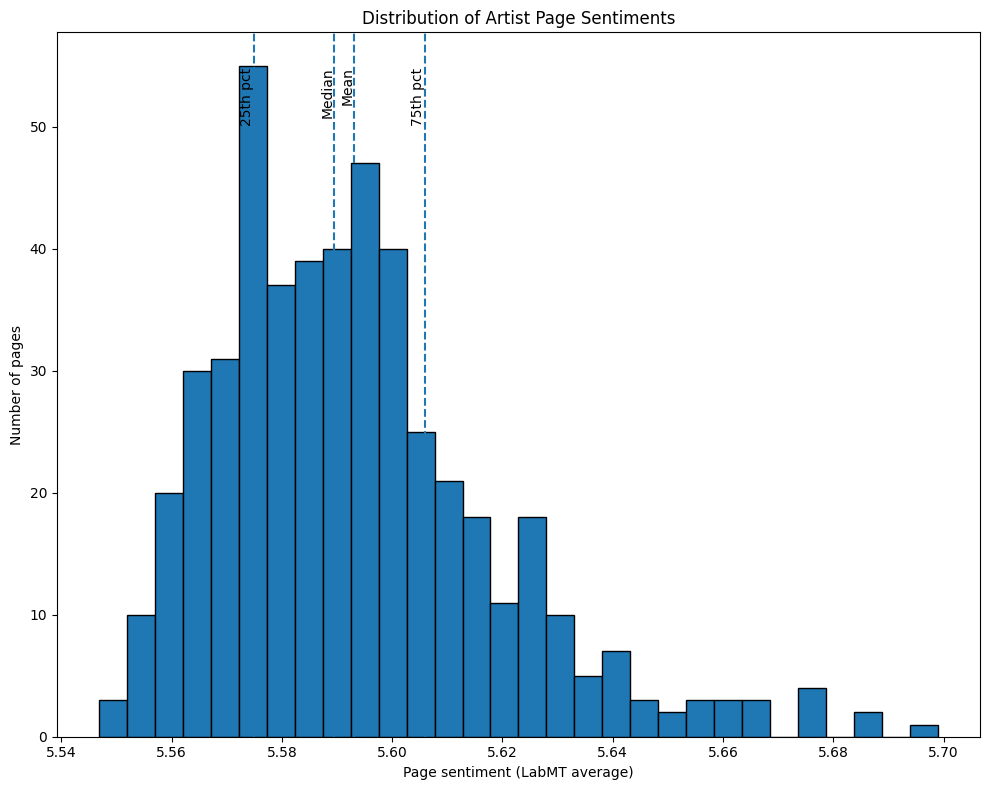

In [27]:
records = []  # rows for DataFrame
total_matched = 0
total_tokens = 0

OUTPUT_CSV = "out.csv"
NUM_BINS = 30
OUTPUT_PNG = "out.png"

for artist in parsed_manifest:
    text = artist['cleaned_text']

    tokens = tokenize(text)
    avg, matched = sentiment_for_tokens(tokens, lex)
    title = artist["title"]
    record = {
        "artist": title,
        
        "sentiment": avg,
        "matched_tokens": matched,
        "total_tokens": len(tokens),
        "coverage": (matched / len(tokens)) if len(tokens) else 0.0,
    }
    records.append(record)
    total_matched += matched
    total_tokens += len(tokens)

df = pd.DataFrame.from_records(records)
# Keep only rows with a computed sentiment
df_valid = df.dropna(subset=["sentiment"]).copy()

if df_valid.empty:
    raise RuntimeError("No documents had any tokens that matched the LabMT lexicon.")

# 4) Descriptive stats
sentiments = df_valid["sentiment"].to_numpy()
mean_sent = float(np.mean(sentiments))
median_sent = float(np.median(sentiments))
# Sample variance (ddof=1) for descriptive stats
variance_sent = float(np.var(sentiments, ddof=1)) if len(sentiments) > 1 else 0.0
p25 = float(np.percentile(sentiments, 25))
p75 = float(np.percentile(sentiments, 75))

# 5) Print summary
print("\n----- Summary Statistics (per-page sentiments) -----")
print(f"Documents with sentiment: {len(df_valid)} / {len(df)}")
print(f"Mean:     {mean_sent:.4f}")
print(f"Median:   {median_sent:.4f}")
print(f"Variance: {variance_sent:.6f}")
print(f"25th pct: {p25:.4f}")
print(f"75th pct: {p75:.4f}")
print(f"Matched lexicon tokens: {total_matched:,} / {total_tokens:,} total tokens")

# 6) Top/bottom 10 artists
top10 = df_valid.sort_values("sentiment", ascending=False).head(10)
bottom10 = df_valid.sort_values("sentiment", ascending=True).head(10)

print("\n----- Top 10 Happiest Pages -----")
for _, r in top10.iterrows():
    print(f"{r['artist']:<35}  {r['sentiment']:.4f}  (matched {int(r['matched_tokens'])})")

print("\n----- Top 10 Saddest Pages -----")
for _, r in bottom10.iterrows():
    print(f"{r['artist']:<35}  {r['sentiment']:.4f}  (matched {int(r['matched_tokens'])})")

# 7) Save CSV of full results
df.sort_values("sentiment", ascending=False, na_position="last").to_csv(OUTPUT_CSV, index=False)
print(f"\nSaved detailed results to: {OUTPUT_CSV}")

# 8) Plot histogram
plt.figure(figsize=(10,8))
plt.hist(sentiments, bins=NUM_BINS, edgecolor="black")
plt.xlabel("Page sentiment (LabMT average)")
plt.ylabel("Number of pages")
plt.title("Distribution of Artist Page Sentiments")

# Vertical lines for summary stats
for val, label in [
    (mean_sent, "Mean"),
    (median_sent, "Median"),
    (p25, "25th pct"),
    (p75, "75th pct"),
]:
    plt.axvline(val, linestyle="--", linewidth=1.5)
    # Annotate slightly above the top of the bars
    ylim = plt.gca().get_ylim()
    plt.text(val, ylim[1]*0.95, label, rotation=90, va="top", ha="right")


plt.tight_layout()
plt.show()
plt.close()

Thanks to the LabMT evaluated tokens, we are able to compute an average of the sentiment of all the tokens of a piece of text.

For every artist in the network, we compute the sentiment (which is done by a simple lookup in LabMT) and of all the tokens in its wikipedia page
and compute the average.

Then we compute the mean, the median, the variance and the 25th and 75th percentile.
From both the summary statistics and the plot, we can see that the data follows a normal distribution with a low variance (0.0006).

We are also able to compute the 10 happiest and saddest pages. Not surprisingly, the saddest and the happiest pages are very similar in sentiment values.

This can be explained by the fact that the majority of the words that we are able to extract a sentiment value for, are not very polarizing.
It is also important to consider that all the pages share the same writing-style and share a good amount of the tokens. Even if a page contains some very polarizing (with very low or very high values of sentiment), their effect would be "diluted" in the thousands of tokens composing a page.

## 4.2 Discuss the sentiment of the communities. Do the findings using TF-IDF during Lecture 7 help you understand your results?

In order to compute the sentiment of the communities, we use the communities that were extracted previously using the Louvain method.

It is important to keep in mind that this was done only on the artist pages that contain a genre box.

In [28]:
COMMUNITIES_URL = "https://raw.githubusercontent.com/lorenzocazzador/socialgraphs-data/refs/heads/main/rock_performers_wikitext/louvain_communities.csv"

r = requests.get(COMMUNITIES_URL)
if r.status_code != 200 or not r.text.strip():
    raise Exception("Can't get communities")

comm_text = r.text

comm_io = StringIO(comm_text)

comm = pd.read_csv(comm_io)

In [29]:
import numpy as np
import pandas as pd

# Build a fast lookup: artist -> community
comm_lookup = dict(zip(comm['artist'], comm['community']))

sentiment_comm = {}

for _, artist in df.iterrows():
    name = artist['artist']
    sent = artist['sentiment']

    # skip artists with no community or no sentiment
    cid = comm_lookup.get(name)
    if cid is None or pd.isna(sent):
        continue

    sentiment_comm.setdefault(cid, []).append(sent)

# Compute stats per community
for cid, vals in sentiment_comm.items():
    vals = np.array(vals, dtype=float)
    n = len(vals)
    mean_ = np.mean(vals)
    median_ = np.median(vals)
    var_ = np.var(vals, ddof=1) if n > 1 else 0.0
    p25 = np.percentile(vals, 25)
    p75 = np.percentile(vals, 75)

    print(f"Community {cid}: n={n}, mean={mean_:.3f}, median={median_:.3f}, "
          f"var={var_:.4f}, p25={p25:.3f}, p75={p75:.3f}")


Community 4: n=50, mean=5.586, median=5.583, var=0.0002, p25=5.576, p75=5.596
Community 2: n=98, mean=5.598, median=5.596, var=0.0006, p25=5.580, p75=5.611
Community 5: n=79, mean=5.599, median=5.594, var=0.0009, p25=5.575, p75=5.619
Community 6: n=35, mean=5.588, median=5.587, var=0.0005, p25=5.574, p75=5.597
Community 0: n=49, mean=5.586, median=5.582, var=0.0006, p25=5.573, p75=5.597
Community 1: n=1, mean=5.571, median=5.571, var=0.0000, p25=5.571, p75=5.571
Community 3: n=1, mean=5.554, median=5.554, var=0.0000, p25=5.554, p75=5.554
Community 7: n=1, mean=5.563, median=5.563, var=0.0000, p25=5.563, p75=5.563


The community means that we extract are nearly identical. The TF-IDF results from Lecture 7
can help to explain why community memebership doesn't create sentiment shifts in the groups.

First of all, the highest tf-idf terms are mostly neutral words that LabMT ratest near the middle (for example
words like tour,number,songs,guitar). These words fail to "polarize" the result for a specific community.

In addition to that, many formatting symbols are present. These terms help to create distinct communities
(for example C7 contains many terms including quotation symbols) but don't have any sentiment value. These terms became distinctive because of TF-IDF even though they don't carry any information sentiment-wise.

Last but not least, all communities share Wikipedia-style prose. This common "neutral" baseline has the
effect of bringing the sentiment value near the full-set mean.

In order to surface differences, these approaches could be tried:

- remove all formatting symbols
- apply a stop band to not consider sentiment-neutral words

# Contribution

- **Part 1**: Manuel Lovo (s243123)
- **Part 2**: Lorenzo Cazzador (s243133)
- **Part 3**: Lorenzo Cazzador (s243133), Alberto Basaglia (s243124), Manuel Lovo (s243123)
- **Part 4**: Alberto Basaglia (s243124)